# 🔥 Wildfire Detection & Analysis System v3
## Google Earth Engine + Sentinel-2 + Deep Learning

**Architecture**: Bi-temporal Sentinel-2 patch extraction → Spectral index engineering (11 channels, led by dNBR) → Classification (3 model comparison) → Segmentation (3 model comparison) → Full fire analysis pipeline (9 outputs).

**Core insight**: dNBR (differential Normalized Burn Ratio) is the single most powerful feature for wildfire detection. It directly encodes burn severity from physics — pre-fire NBR minus post-fire NBR.

**Design philosophy**:
- **Physics**: Spectral indices encode real ground truth about fire behavior
- **Data**: Multi-region (11 regions, 4 continents), multi-year satellite patches with real FIRMS labels
- **Learning**: Lightweight models matched to dataset size (~1000-2000 samples), not ImageNet scale

---

In [1]:
# ══════════════════════════════════════════════════════════════
# Section 0 — Package Installation
# ══════════════════════════════════════════════════════════════

!pip install -q earthengine-api tensorflow numpy pandas \
                matplotlib seaborn scikit-learn scipy pillow

In [2]:
# ══════════════════════════════════════════════════════════════
# Section 0 — Imports & GPU Configuration
# ══════════════════════════════════════════════════════════════

import ee
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap, BoundaryNorm
import seaborn as sns
import json
import os
import gc
import time
import random
import warnings
import math
import threading
import concurrent.futures
from datetime import datetime, timedelta
from scipy.ndimage import median_filter
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.metrics import (roc_auc_score, f1_score, precision_score,
                             recall_score, confusion_matrix, roc_curve)

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.layers import (
    Conv2D, BatchNormalization, ReLU, MaxPooling2D,
    GlobalAveragePooling2D, Dense, Dropout, Input,
    Add, Concatenate, UpSampling2D, DepthwiseConv2D, Reshape
)

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')

# ══════════════════════════════════════════════════════════════
# CRITICAL — GPU Memory Growth
# Without this, TF allocates ALL GPU memory on startup, leaving
# none for data loading. set_memory_growth enables dynamic allocation.
# ══════════════════════════════════════════════════════════════
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)
    print(f'GPU(s) detected: {[g.name for g in gpus]}')
    print(f'Memory growth enabled.')
else:
    print('No GPU detected - training will be slow on CPU.')

print(f'TensorFlow version: {tf.__version__}')
print(f'NumPy version:      {np.__version__}')

GPU(s) detected: ['/physical_device:GPU:0']
Memory growth enabled.
TensorFlow version: 2.19.0
NumPy version:      2.0.2


## Section 1 — GEE Authentication & Google Drive Mount

Google Earth Engine (GEE) is our satellite data source. We use the Python API
to query Sentinel-2 and FIRMS collections. Google Drive stores our dataset
and model checkpoints between Colab sessions.

> **Note**: Replace `'YOUR_PROJECT_ID'` with your actual GEE Cloud Project ID.

In [3]:
!pip install earthengine-api

import ee

try:
    ee.Initialize(project='projectearthengine-493104')
    print("EE already initialized")
except:
    ee.Authenticate()
    ee.Initialize(project='projectearthengine-493104')
    print("EE authenticated and initialized")

EE authenticated and initialized


In [4]:
# ══════════════════════════════════════════════════════════════
# Section 1 — GEE Authentication & Drive Mount
# ══════════════════════════════════════════════════════════════

from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


## Section 2 — Global Configuration

Every hyperparameter and path is centralized here. Key design decisions:

| Parameter | Value | Why |
|---|---|---|
| `PATCH_SIZE=128` | 128 x 20m = 2.56 km side | Large enough to capture fire context, small enough for GPU memory |
| `RESOLUTION_M=20` | 20m GSD | Sentinel-2 SWIR bands are native 20m; resampling B8 (10m) down avoids artifacts |
| `MAX_CLOUD_PCT=15` | Strict cloud filter | Clouds corrupt spectral indices, especially dNBR |
| `MASK_DNBR_THR=0.15` | Not 0.27 | At 128px patches, 0.27 yields <5% fire pixels, causing model collapse to all-zeros |
| `LR=1e-3` | Higher than fine-tuning | From-scratch training on small datasets needs aggressive learning |
| `BATCH_SIZE=8` (seg) | Small | 128px patches are large; 8 fits comfortably in T4 16GB |

In [5]:
# ══════════════════════════════════════════════════════════════
# Section 2 — Global Configuration
# ══════════════════════════════════════════════════════════════

SAVE_DIR = '/content/drive/MyDrive/wildfire_system_v3'
os.makedirs(SAVE_DIR, exist_ok=True)

CFG = {
    # Patch geometry
    'PATCH_SIZE'       : 128,
    'RESOLUTION_M'     : 20,
    'BUFFER_M'         : 1280,

    # Sentinel-2 bands (7 raw bands extracted)
    'BANDS'            : ['B2', 'B3', 'B4', 'B8', 'B8A', 'B11', 'B12'],

    # GEE data filters
    'MAX_CLOUD_PCT'    : 15,
    'FIRMS_CONFIDENCE' : 60,
    'POST_WINDOW_DAYS' : 8,
    'PRE_WINDOW_DAYS'  : (20, 50),
    'MIN_FIRE_DIST_KM' : 10,

    # Dataset
    'N_FIRE_SAMPLES'   : 150,
    'TRAIN_RATIO'      : 0.70,
    'VAL_RATIO'        : 0.15,
    'TEST_RATIO'       : 0.15,

    # Feature channels
    'N_CHANNELS'       : 11,

    # Training
    'BATCH_SIZE'       : 8,
    'EPOCHS'           : 80,
    'LR'               : 1e-3,

    # dNBR severity thresholds (USGS standard)
    'DNBR_HIGH'        : 0.66,
    'DNBR_MOD'         : 0.27,
    'DNBR_LOW'         : 0.10,

    # Mask generation threshold
    'MASK_DNBR_THR'    : 0.15,

    # Paths
    'DATASET_PATH'     : f'{SAVE_DIR}/wildfire_dataset_v3.npz',
    'BEST_CLF_PATH'    : f'{SAVE_DIR}/best_clf_model.keras',
    'BEST_SEG_PATH'    : f'{SAVE_DIR}/best_seg_model.keras',
    'REPORT_PATH'      : f'{SAVE_DIR}/fire_report.json',
}

print('Configuration loaded.')
for k, v in CFG.items():
    print(f'   {k:25s}: {v}')

Configuration loaded.
   PATCH_SIZE               : 128
   RESOLUTION_M             : 20
   BUFFER_M                 : 1280
   BANDS                    : ['B2', 'B3', 'B4', 'B8', 'B8A', 'B11', 'B12']
   MAX_CLOUD_PCT            : 15
   FIRMS_CONFIDENCE         : 60
   POST_WINDOW_DAYS         : 8
   PRE_WINDOW_DAYS          : (20, 50)
   MIN_FIRE_DIST_KM         : 10
   N_FIRE_SAMPLES           : 150
   TRAIN_RATIO              : 0.7
   VAL_RATIO                : 0.15
   TEST_RATIO               : 0.15
   N_CHANNELS               : 11
   BATCH_SIZE               : 8
   EPOCHS                   : 80
   LR                       : 0.001
   DNBR_HIGH                : 0.66
   DNBR_MOD                 : 0.27
   DNBR_LOW                 : 0.1
   MASK_DNBR_THR            : 0.15
   DATASET_PATH             : /content/drive/MyDrive/wildfire_system_v3/wildfire_dataset_v3.npz
   BEST_CLF_PATH            : /content/drive/MyDrive/wildfire_system_v3/best_clf_model.keras
   BEST_SEG_PATH            : 

## Section 3 — GEE Helper Functions

Earth Engine API calls are network-bound and can fail silently. Three safety wrappers:

1. **`gee_retry`** — Exponential backoff with jitter (5 attempts)
2. **`fetch_with_timeout`** — 45-second hard timeout on `sampleRectangle()`
3. **`cloud_mask_s2`** — QA60-based cloud masking for Sentinel-2

In [6]:
# ══════════════════════════════════════════════════════════════
# Section 3 — GEE Helper Functions
# ══════════════════════════════════════════════════════════════

def gee_retry(func, retries=5, wait=10):
    """Execute a GEE function with exponential backoff retry."""
    for attempt in range(retries):
        try:
            return func()
        except ee.EEException as e:
            if attempt == retries - 1:
                raise
            sleep = wait * (2 ** attempt) + random.uniform(0, 3)
            print(f'  GEE retry {attempt+1}/{retries}: {e}')
            time.sleep(sleep)
        except Exception:
            raise

def fetch_with_timeout(fn, timeout=45):
    """Execute a function with a hard timeout (seconds).
    Returns None on timeout instead of hanging indefinitely."""
    with concurrent.futures.ThreadPoolExecutor(max_workers=1) as ex:
        future = ex.submit(fn)
        try:
            return future.result(timeout=timeout)
        except concurrent.futures.TimeoutError:
            print('  Timeout reached - skipping this patch.')
            return None

def cloud_mask_s2(image):
    """Apply Sentinel-2 QA60 cloud mask.
    Bit 10 = opaque cloud, Bit 11 = cirrus."""
    qa = image.select('QA60')
    cloud_bit_mask = 1 << 10
    cirrus_bit_mask = 1 << 11
    mask = qa.bitwiseAnd(cloud_bit_mask).eq(0).And(
           qa.bitwiseAnd(cirrus_bit_mask).eq(0))
    return image.updateMask(mask).divide(10000)

def haversine(lat1, lon1, lat2, lon2):
    """Great-circle distance between two points in km."""
    R = 6371.0
    dlat = math.radians(lat2 - lat1)
    dlon = math.radians(lon2 - lon1)
    a = (math.sin(dlat/2)**2 +
         math.cos(math.radians(lat1)) * math.cos(math.radians(lat2)) *
         math.sin(dlon/2)**2)
    return R * 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))

print('GEE helper functions defined.')

GEE helper functions defined.


## Section 4 — FIRMS Data Loading (Ground Truth Labels)

NASA FIRMS provides global active fire detections from MODIS:
- **Collection**: `'FIRMS'` — the EXACT string that works in GEE
- **Scale**: `1000` — MODIS native resolution (NOT 375, that's VIIRS)
- **Confidence band**: 0-100 score; we filter >= 60 to reduce noise

In [7]:
# ══════════════════════════════════════════════════════════════
# Section 4 — FIRMS Fire Point Loading
# ══════════════════════════════════════════════════════════════

def get_firms_fire_points(bbox, start_date, end_date, max_points=150):
    """Query FIRMS for fire detections within a bounding box and date range."""
    roi = ee.Geometry.Rectangle(bbox)

    def _query():
        firms = (ee.ImageCollection('FIRMS')
                 .filterDate(start_date, end_date)
                 .filterBounds(roi)
                 .select('confidence'))
        max_conf = firms.max()
        fire_mask = max_conf.gte(CFG['FIRMS_CONFIDENCE'])
        fire_img = max_conf.updateMask(fire_mask)
        points = fire_img.sample(
            region=roi, scale=1000, numPixels=max_points * 3,
            seed=42, geometries=True)
        return points.getInfo()

    result = gee_retry(_query)

    if result is None or 'features' not in result:
        print(f'  No FIRMS data returned for bbox={bbox}')
        return []

    fire_points = []
    for feat in result['features']:
        coords = feat['geometry']['coordinates']
        conf = feat['properties'].get('confidence', 0)
        if conf >= CFG['FIRMS_CONFIDENCE']:
            fire_points.append({
                'lat': coords[1], 'lon': coords[0],
                'date': start_date, 'confidence': conf / 100.0
            })

    # Deduplicate: keep points at least 0.5km apart
    filtered = []
    for pt in fire_points:
        too_close = False
        for existing in filtered:
            if haversine(pt['lat'], pt['lon'], existing['lat'], existing['lon']) < 0.5:
                too_close = True
                break
        if not too_close:
            filtered.append(pt)
        if len(filtered) >= max_points:
            break

    print(f'  Found {len(filtered)} fire points (from {len(fire_points)} raw)')
    return filtered

print('FIRMS fire point loader defined.')

FIRMS fire point loader defined.


## Section 5 — Sentinel-2 Patch Extraction

For each fire point, we extract a **bi-temporal pair**:
- **POST-fire**: +/- 8 days around fire date (captures active/recent burn)
- **PRE-fire**: 20-50 days before fire (clean vegetation baseline)

Both are extracted as `(128, 128, 7)` NumPy arrays at 20m resolution.

In [8]:
# ══════════════════════════════════════════════════════════════
# Section 5 — Sentinel-2 Patch Extraction
# ══════════════════════════════════════════════════════════════

def extract_s2_patch(lat, lon, date_str, window_days=8, pre_fire=False):
    """Extract a single Sentinel-2 patch centered on (lat, lon)."""
    point = ee.Geometry.Point(lon, lat)
    buffer_m = CFG['BUFFER_M']
    roi = point.buffer(buffer_m).bounds()
    bands = CFG['BANDS']
    target_size = CFG['PATCH_SIZE']

    if pre_fire:
        pre_start, pre_end = CFG['PRE_WINDOW_DAYS']
        ref = datetime.strptime(date_str, '%Y-%m-%d')
        start = (ref - timedelta(days=pre_end)).strftime('%Y-%m-%d')
        end = (ref - timedelta(days=pre_start)).strftime('%Y-%m-%d')
    else:
        ref = datetime.strptime(date_str, '%Y-%m-%d')
        start = (ref - timedelta(days=window_days)).strftime('%Y-%m-%d')
        end = (ref + timedelta(days=window_days)).strftime('%Y-%m-%d')

    def _extract():
        col = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
               .filterDate(start, end)
               .filterBounds(roi)
               .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', CFG['MAX_CLOUD_PCT']))
               .map(cloud_mask_s2)
               .select(bands)
               .sort('CLOUDY_PIXEL_PERCENTAGE'))
        count = col.size().getInfo()
        if count == 0:
            return None
        img = col.first().clip(roi)
        img = img.reproject(crs='EPSG:4326', scale=CFG['RESOLUTION_M'])

        def _sample():
            return img.sampleRectangle(region=roi, defaultValue=0).getInfo()

        result = fetch_with_timeout(_sample, timeout=45)
        if result is None:
            return None

        arrays = []
        props = result.get('properties', {})
        for band in bands:
            arr = np.array(props.get(band, []))
            if arr.ndim < 2 or arr.size == 0:
                return None
            arrays.append(arr)

        patch = np.stack(arrays, axis=-1).astype(np.float32)

        if patch.shape[0] != target_size or patch.shape[1] != target_size:
            resized = np.zeros((target_size, target_size, len(bands)), dtype=np.float32)
            for i in range(len(bands)):
                img_pil = Image.fromarray(patch[:, :, i])
                img_pil = img_pil.resize((target_size, target_size), Image.BILINEAR)
                resized[:, :, i] = np.array(img_pil)
            patch = resized
        return patch

    try:
        return gee_retry(_extract)
    except Exception as e:
        print(f'  Patch extraction failed at ({lat:.3f}, {lon:.3f}): {e}')
        return None


def extract_bitemporal_pair(lat, lon, date_str):
    """Extract pre-fire and post-fire Sentinel-2 patches."""
    post_patch = extract_s2_patch(lat, lon, date_str, pre_fire=False)
    if post_patch is None:
        return None, None
    pre_patch = extract_s2_patch(lat, lon, date_str, pre_fire=True)
    if pre_patch is None:
        return None, None
    if (np.isnan(pre_patch).any() or np.isnan(post_patch).any() or
        pre_patch.max() == 0 or post_patch.max() == 0):
        return None, None
    return pre_patch, post_patch

print('Sentinel-2 patch extraction functions defined.')

Sentinel-2 patch extraction functions defined.


## Section 6 — Negative Sample Generation

Negative (no-fire) samples must be at least 10 km from any known fire point,
from the same temporal context and geographic region.

In [9]:
# ══════════════════════════════════════════════════════════════
# Section 6 — Negative Sample Generation
# ══════════════════════════════════════════════════════════════

def generate_negative_samples(bbox, fire_points, n_samples, date_str):
    """Generate negative (no-fire) sample locations >= MIN_FIRE_DIST_KM from fires."""
    west, south, east, north = bbox
    min_dist = CFG['MIN_FIRE_DIST_KM']
    negatives = []
    max_attempts = n_samples * 20
    attempts = 0

    while len(negatives) < n_samples and attempts < max_attempts:
        attempts += 1
        lat = random.uniform(south + 0.05, north - 0.05)
        lon = random.uniform(west + 0.05, east - 0.05)

        far_enough = True
        for fp in fire_points:
            if haversine(lat, lon, fp['lat'], fp['lon']) < min_dist:
                far_enough = False
                break

        if far_enough:
            for neg in negatives:
                if haversine(lat, lon, neg['lat'], neg['lon']) < 1.0:
                    far_enough = False
                    break

        if far_enough:
            negatives.append({'lat': lat, 'lon': lon, 'date': date_str, 'confidence': 0.0})

    print(f'  Generated {len(negatives)} negative samples (>={min_dist}km from fires)')
    return negatives

print('Negative sample generator defined.')

Negative sample generator defined.


## Section 7 — Spectral Index Computation

From the 7-band bi-temporal pair, we compute 4 additional spectral indices
to create an 11-channel feature stack. **dNBR is the most important feature** —
it directly encodes burn severity from physics.

dNBR gets a 3x3 median filter to suppress salt-and-pepper noise from cloud edges.

In [10]:
# ══════════════════════════════════════════════════════════════
# Section 7 — Spectral Index Computation
# ══════════════════════════════════════════════════════════════

BAND_IDX = {'B2': 0, 'B3': 1, 'B4': 2, 'B8': 3, 'B8A': 4, 'B11': 5, 'B12': 6}

CHANNEL_NAMES = ['B4', 'B8', 'B11', 'B12', 'NDVI', 'NBR', 'dNBR',
                 'BAI', 'EVI', 'NDWI', 'SWIR']

def compute_spectral_indices(pre_patch, post_patch):
    """Compute 11-channel feature stack from bi-temporal Sentinel-2 pair.
    Output: (128, 128, 11) = [B4, B8, B11, B12, NDVI, NBR, dNBR, BAI, EVI, NDWI, SWIR]"""
    eps = 1e-8

    B2_post  = post_patch[..., BAND_IDX['B2']]
    B3_post  = post_patch[..., BAND_IDX['B3']]
    B4_post  = post_patch[..., BAND_IDX['B4']]
    B8_post  = post_patch[..., BAND_IDX['B8']]
    B11_post = post_patch[..., BAND_IDX['B11']]
    B12_post = post_patch[..., BAND_IDX['B12']]

    B4_pre  = pre_patch[..., BAND_IDX['B4']]
    B8_pre  = pre_patch[..., BAND_IDX['B8']]
    B11_pre = pre_patch[..., BAND_IDX['B11']]

    NDVI = (B8_post - B4_post) / (B8_post + B4_post + eps)
    NBR_post = (B8_post - B11_post) / (B8_post + B11_post + eps)
    NBR_pre = (B8_pre - B11_pre) / (B8_pre + B11_pre + eps)

    dNBR = NBR_pre - NBR_post
    dNBR = median_filter(dNBR, size=3).astype(np.float32)

    BAI = 1.0 / ((0.1 - B4_post)**2 + (0.06 - B8_post)**2 + eps)
    bai_cap = np.percentile(BAI, 99)
    BAI = np.clip(BAI, 0, bai_cap)

    EVI = 2.5 * (B8_post - B4_post) / (B8_post + 6*B4_post - 7.5*B2_post + 1 + eps)
    NDWI = (B3_post - B8_post) / (B3_post + B8_post + eps)
    SWIR = B11_post

    stack = np.stack([
        B4_post, B8_post, B11_post, B12_post,
        NDVI, NBR_post, dNBR, BAI, EVI, NDWI, SWIR
    ], axis=-1).astype(np.float32)

    return stack

print(f'Spectral index computation defined. Output channels ({len(CHANNEL_NAMES)}): {CHANNEL_NAMES}')

Spectral index computation defined. Output channels (11): ['B4', 'B8', 'B11', 'B12', 'NDVI', 'NBR', 'dNBR', 'BAI', 'EVI', 'NDWI', 'SWIR']


## Section 8 — Multi-Region Dataset Assembly

We collect data from **11 fire regions across 4 continents** to force the model
to learn spectral physics of fire, not regional surface appearance.

In [11]:
# ══════════════════════════════════════════════════════════════
# Section 8 — Multi-Region Dataset Assembly
# ══════════════════════════════════════════════════════════════

FIRE_REGIONS = [
    ('California_Dixie_2021',  [-121.5, 39.5, -120.0, 40.5], '2021-07-01', '2021-09-30'),
        ('California_Camp_2018',   [-122.0, 39.5, -120.5, 40.5], '2018-11-01', '2018-12-01'),
        ('Greece_Attica_2021',     [  23.0, 38.0,   24.5, 39.0], '2021-08-01', '2021-09-01'),
        ('Turkey_Antalya_2021',    [  29.5, 36.0,   31.5, 37.5], '2021-07-01', '2021-09-01'),
        ('Portugal_2017',          [  -8.5, 39.5,   -7.0, 41.0], '2017-10-01', '2017-11-01'),
        ('Oregon_Bootleg_2021',    [-122.0, 42.0, -120.5, 43.0], '2021-07-01', '2021-09-01'),
        ('Canada_BC_2021',         [-122.0, 49.5, -119.0, 51.5], '2021-07-01', '2021-09-30'),
        ('Siberia_2021',           [  95.0, 58.0,   98.0, 61.0], '2021-07-01', '2021-09-01'),
        ('Australia_NSW_2020',     [ 149.0,-34.0,  151.0,-32.0], '2020-01-01', '2020-03-01'),
        ('Chile_2017',             [ -73.0,-37.0,  -70.0,-35.0], '2017-01-01', '2017-03-01'),
        ('Indonesia_Kalimantan',   [ 113.0, -2.5,  116.0,  0.5], '2019-09-01', '2019-11-01'),
]

def collect_region_data(name, bbox, start_date, end_date):
    """Collect fire and no-fire samples from a single region."""
    print(f'\n{"="*60}')
    print(f'Processing region: {name}')
    print(f'   Bbox: {bbox}, Dates: {start_date} to {end_date}')
    print(f'{"="*60}')

    X_list, y_list = [], []

    fire_points = get_firms_fire_points(bbox, start_date, end_date,
                                         max_points=CFG['N_FIRE_SAMPLES'])
    if len(fire_points) == 0:
        print(f'  No fire points found - skipping region')
        return X_list, y_list

    fire_success = 0
    for i, fp in enumerate(fire_points):
        if i % 10 == 0:
            print(f'  Fire sample {i+1}/{len(fire_points)}...')
        pre, post = extract_bitemporal_pair(fp['lat'], fp['lon'], fp['date'])
        if pre is not None and post is not None:
            features = compute_spectral_indices(pre, post)
            if not np.isnan(features).any() and features.max() > 0:
                X_list.append(features)
                y_list.append(fp['confidence'])
                fire_success += 1
        time.sleep(0.3)

    print(f'  Fire patches extracted: {fire_success}/{len(fire_points)}')

    neg_points = generate_negative_samples(bbox, fire_points,
                                            n_samples=fire_success, date_str=start_date)
    neg_success = 0
    for i, np_pt in enumerate(neg_points):
        if i % 10 == 0:
            print(f'  No-fire sample {i+1}/{len(neg_points)}...')
        ref_date = random.choice(fire_points)['date']
        pre, post = extract_bitemporal_pair(np_pt['lat'], np_pt['lon'], ref_date)
        if pre is not None and post is not None:
            features = compute_spectral_indices(pre, post)
            if not np.isnan(features).any() and features.max() > 0:
                X_list.append(features)
                y_list.append(0.0)
                neg_success += 1
        time.sleep(0.3)

    print(f'  No-fire patches extracted: {neg_success}/{len(neg_points)}')
    print(f'  Region total: {len(X_list)} samples ({fire_success} fire + {neg_success} no-fire)')
    return X_list, y_list


def build_full_dataset():
    """Collect data from all 11 fire regions and save to Drive."""
    all_X, all_y = [], []
    for name, bbox, start, end in FIRE_REGIONS:
        try:
            X_region, y_region = collect_region_data(name, bbox, start, end)
            all_X.extend(X_region)
            all_y.extend(y_region)
            print(f'  Running total: {len(all_X)} samples')
        except Exception as e:
            print(f'  Region {name} failed: {e}')
            continue

    if len(all_X) == 0:
        print('FATAL: No samples collected from any region!')
        return None, None

    X = np.array(all_X, dtype=np.float32)
    y = np.array(all_y, dtype=np.float32)
    print(f'\nFULL DATASET: {X.shape[0]} samples, Shape: X={X.shape}, y={y.shape}')
    print(f'Fire ratio: {np.mean(y > 0.5):.2%}, Memory: {X.nbytes / 1e6:.1f} MB')
    return X, y

print(f'Multi-region dataset assembly defined. Regions: {len(FIRE_REGIONS)}')

Multi-region dataset assembly defined. Regions: 11


In [12]:
# ══════════════════════════════════════════════════════════════
# Normalize & Split Dataset
# ══════════════════════════════════════════════════════════════

def normalize_and_split(X, y):
    """Z-score normalize per channel (training stats only) and split."""
    y_bin = (y >= 0.5).astype(int)
    X_trainval, X_test, y_trainval, y_test = train_test_split(
        X, y, test_size=CFG['TEST_RATIO'], random_state=42, stratify=y_bin)

    y_bin_tv = (y_trainval >= 0.5).astype(int)
    val_frac = CFG['VAL_RATIO'] / (CFG['TRAIN_RATIO'] + CFG['VAL_RATIO'])
    X_train, X_val, y_train, y_val = train_test_split(
        X_trainval, y_trainval, test_size=val_frac, random_state=42, stratify=y_bin_tv)

    print(f'Split sizes: train={len(X_train)}, val={len(X_val)}, test={len(X_test)}')

    means = X_train.mean(axis=(0, 1, 2))
    stds = X_train.std(axis=(0, 1, 2))
    stds[stds < 1e-8] = 1.0

    X_train = (X_train - means) / stds
    X_val   = (X_val   - means) / stds
    X_test  = (X_test  - means) / stds
    return X_train, X_val, X_test, y_train, y_val, y_test, means, stds


def save_dataset(X_train, X_val, X_test, y_train, y_val, y_test, means, stds):
    """Save the complete dataset to a .npz file on Google Drive."""
    np.savez_compressed(CFG['DATASET_PATH'],
        X_train=X_train, X_val=X_val, X_test=X_test,
        y_train=y_train, y_val=y_val, y_test=y_test,
        means=means, stds=stds)
    fsize = os.path.getsize(CFG['DATASET_PATH']) / 1e6
    print(f'Dataset saved to {CFG["DATASET_PATH"]} ({fsize:.1f} MB)')


def load_dataset():
    """Load dataset from .npz file."""
    data = np.load(CFG['DATASET_PATH'])
    print(f'Dataset loaded from {CFG["DATASET_PATH"]}')
    return (data['X_train'], data['X_val'], data['X_test'],
            data['y_train'], data['y_val'], data['y_test'],
            data['means'], data['stds'])

print('Normalize, split, save/load functions defined.')

Normalize, split, save/load functions defined.


## Section 9 — Dataset Validation (MANDATORY)

**Never train without validating the dataset first.** These checks catch:
1. **Fire pixel ratio out of range** - model predicts all-zeros (segmentation collapse)
2. **Class imbalance** - classifier is biased toward majority class
3. **Dead channels** - model ignores important spectral information

In [13]:
# ══════════════════════════════════════════════════════════════
# Section 9 — Dataset Validation
# ══════════════════════════════════════════════════════════════

def validate_dataset(X_train, X_val, X_test, y_train, y_val, y_test, means, stds):
    """Run all mandatory dataset checks. Returns True if all pass."""
    all_passed = True
    print('='*60)
    print('DATASET VALIDATION')
    print('='*60)

    # 7.1: Mask fire pixel ratio
    print('\n-- 7.1: Mask Fire Pixel Ratio --')
    thr = CFG['MASK_DNBR_THR']
    dNBR_train_raw = X_train[..., 6] * stds[6] + means[6]
    dNBR_val_raw   = X_val[..., 6]   * stds[6] + means[6]
    M_train_check = (dNBR_train_raw > thr).astype(np.float32)
    M_val_check   = (dNBR_val_raw   > thr).astype(np.float32)
    train_ratio = M_train_check.mean()
    val_ratio   = M_val_check.mean()
    print(f'  Fire pixel ratio - train: {train_ratio:.4%}')
    print(f'  Fire pixel ratio - val:   {val_ratio:.4%}')
    if train_ratio < 0.08 or train_ratio > 0.40:
        print(f'  FAIL: Train fire pixel ratio out of [8%, 40%] range!')
        all_passed = False
    else:
        print(f'  PASS')

    # 7.2: Class balance
    print('\n-- 7.2: Class Balance --')
    fire_pct_train = np.mean(y_train > 0.5)
    fire_pct_val   = np.mean(y_val > 0.5)
    fire_pct_test  = np.mean(y_test > 0.5)
    print(f'  Train fire %: {fire_pct_train:.2%}')
    print(f'  Val   fire %: {fire_pct_val:.2%}')
    print(f'  Test  fire %: {fire_pct_test:.2%}')
    if fire_pct_train < 0.35 or fire_pct_train > 0.65:
        print(f'  FAIL: Train fire ratio out of [35%, 65%] range!')
        all_passed = False
    else:
        print(f'  PASS')

    # 7.3: Feature sanity
    print('\n-- 7.3: Feature Sanity --')
    for i, name in enumerate(CHANNEL_NAMES):
        ch = X_train[..., i]
        ch_min, ch_max, ch_mean, ch_std = ch.min(), ch.max(), ch.mean(), ch.std()
        status = 'OK' if ch_std > 1e-6 else 'DEAD'
        print(f'  {name:6s}: min={ch_min:8.4f}  max={ch_max:8.4f}  mean={ch_mean:8.4f}  std={ch_std:8.4f}  {status}')
        if ch_std < 1e-6:
            all_passed = False

    print(f'\n{"="*60}')
    if all_passed:
        print('ALL VALIDATION CHECKS PASSED')
    else:
        print('SOME CHECKS FAILED - fix dataset before training!')
    print(f'{"="*60}')
    return all_passed


def visual_sanity_check(X_train, y_train, means, stds):
    """Display 4 fire and 4 no-fire patches as RGB composites with mask overlay."""
    fire_idx = np.where(y_train > 0.5)[0][:4]
    nofire_idx = np.where(y_train <= 0.5)[0][:4]

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle('Visual Sanity Check: Fire (top) vs No-Fire (bottom)',
                 fontsize=14, fontweight='bold')

    for col, idx in enumerate(fire_idx):
        patch = X_train[idx] * stds + means
        rgb = patch[..., [0, 1, 2]].copy()
        for c in range(3):
            p2, p98 = np.percentile(rgb[..., c], [2, 98])
            rgb[..., c] = np.clip((rgb[..., c] - p2) / (p98 - p2 + 1e-8), 0, 1)
        axes[0, col].imshow(rgb)
        dNBR = patch[..., 6]
        mask = dNBR > CFG['MASK_DNBR_THR']
        axes[0, col].contour(mask, colors='red', linewidths=0.8)
        axes[0, col].set_title(f'Fire (conf={y_train[idx]:.2f})', color='red')
        axes[0, col].axis('off')

    for col, idx in enumerate(nofire_idx):
        patch = X_train[idx] * stds + means
        rgb = patch[..., [0, 1, 2]].copy()
        for c in range(3):
            p2, p98 = np.percentile(rgb[..., c], [2, 98])
            rgb[..., c] = np.clip((rgb[..., c] - p2) / (p98 - p2 + 1e-8), 0, 1)
        axes[1, col].imshow(rgb)
        axes[1, col].set_title('No-Fire', color='blue')
        axes[1, col].axis('off')

    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}/visual_sanity_check.png', dpi=150, bbox_inches='tight')
    plt.show()
    print('Visual sanity check complete.')

## Section 10 — Dataset Load or Build

If the `.npz` dataset already exists on Drive, we load it directly.
Otherwise, we build from scratch and save for reuse.

Found existing dataset at /content/drive/MyDrive/wildfire_system_v3/wildfire_dataset_v3.npz
Dataset loaded from /content/drive/MyDrive/wildfire_system_v3/wildfire_dataset_v3.npz

Dataset Summary:
   Train: X=(593, 128, 128, 11), y=(593,)
   Val:   X=(128, 128, 128, 11),   y=(128,)
   Test:  X=(128, 128, 128, 11),  y=(128,)
DATASET VALIDATION

-- 7.1: Mask Fire Pixel Ratio --
  Fire pixel ratio - train: 4.8837%
  Fire pixel ratio - val:   6.8578%
  FAIL: Train fire pixel ratio out of [8%, 40%] range!

-- 7.2: Class Balance --
  Train fire %: 51.10%
  Val   fire %: 51.56%
  Test  fire %: 50.78%
  PASS

-- 7.3: Feature Sanity --
  B4    : min= -1.1054  max= 18.5387  mean=  0.0018  std=  1.0062  OK
  B8    : min= -2.4094  max= 11.6219  mean= -0.0178  std=  1.0112  OK
  B11   : min= -1.8833  max= 10.5299  mean=  0.0030  std=  1.0089  OK
  B12   : min= -1.5227  max= 12.7703  mean=  0.0028  std=  1.0095  OK
  NDVI  : min= -5.4185  max=  1.9947  mean=  0.0063  std=  1.0075  OK
  NBR   : min= -

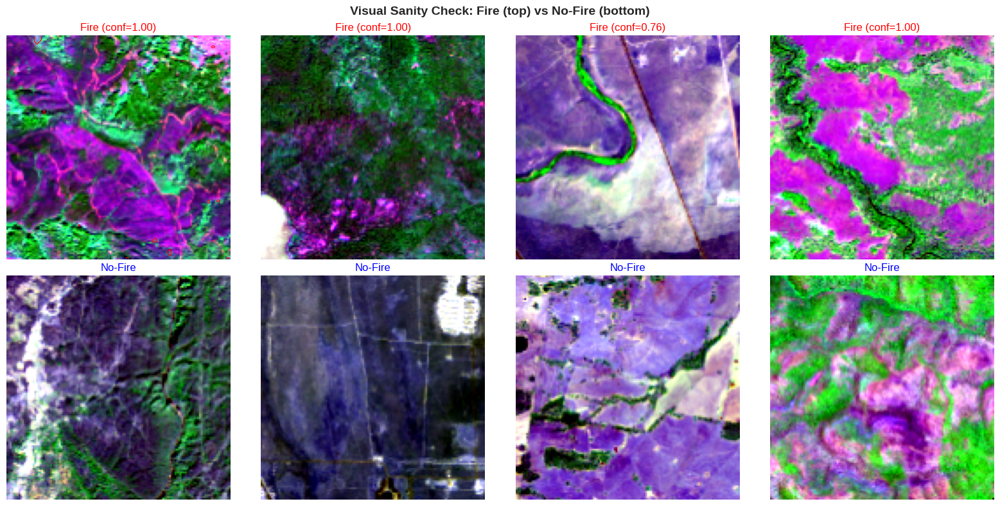

Visual sanity check complete.


In [14]:
# ══════════════════════════════════════════════════════════════
# Section 10 — Load or Build Dataset
# ══════════════════════════════════════════════════════════════

if os.path.exists(CFG['DATASET_PATH']):
    print(f'Found existing dataset at {CFG["DATASET_PATH"]}')
    X_train, X_val, X_test, y_train, y_val, y_test, CH_MEANS, CH_STDS = load_dataset()
else:
    print('No existing dataset found - building from scratch...')
    print('This will take several hours due to GEE API rate limits.')
    X_raw, y_raw = build_full_dataset()
    if X_raw is not None:
        (X_train, X_val, X_test,
         y_train, y_val, y_test,
         CH_MEANS, CH_STDS) = normalize_and_split(X_raw, y_raw)
        save_dataset(X_train, X_val, X_test, y_train, y_val, y_test, CH_MEANS, CH_STDS)
    else:
        raise RuntimeError('Dataset build failed - no data collected.')

print(f'\nDataset Summary:')
print(f'   Train: X={X_train.shape}, y={y_train.shape}')
print(f'   Val:   X={X_val.shape},   y={y_val.shape}')
print(f'   Test:  X={X_test.shape},  y={y_test.shape}')

passed = validate_dataset(X_train, X_val, X_test, y_train, y_val, y_test, CH_MEANS, CH_STDS)
visual_sanity_check(X_train, y_train, CH_MEANS, CH_STDS)

## Section 11 — Exploratory Data Analysis (8 Visualizations)

These 8 charts validate that our feature engineering captures real fire physics.
The most important chart is **8.3: dNBR Distribution** — it proves that dNBR
separates fire from no-fire samples better than any other single channel.

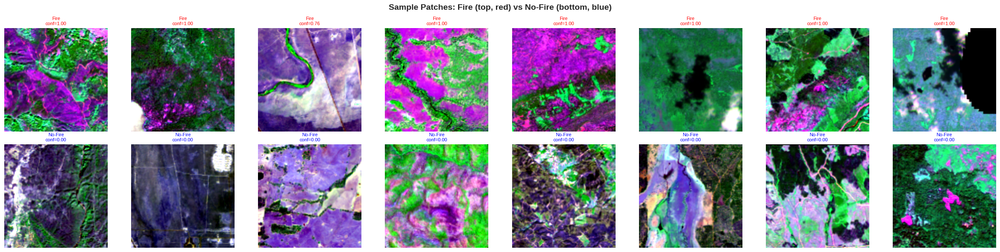

In [15]:
# ══════════════════════════════════════════════════════════════
# EDA 8.1 — Sample Patch Grid
# ══════════════════════════════════════════════════════════════

def eda_sample_grid(X, y, means, stds):
    """Show 8 fire and 8 no-fire sample patches in a grid."""
    fire_idx = np.where(y > 0.5)[0][:8]
    nofire_idx = np.where(y <= 0.5)[0][:8]
    fig, axes = plt.subplots(2, 8, figsize=(24, 6))
    fig.suptitle('Sample Patches: Fire (top, red) vs No-Fire (bottom, blue)',
                 fontsize=14, fontweight='bold')
    for col in range(8):
        for row, (indices, color, label) in enumerate([
            (fire_idx, 'red', 'Fire'), (nofire_idx, 'blue', 'No-Fire')
        ]):
            if col < len(indices):
                idx = indices[col]
                patch = X[idx] * stds + means
                rgb = patch[..., [0, 1, 2]].copy()
                for c in range(3):
                    p2, p98 = np.percentile(rgb[..., c], [2, 98])
                    rgb[..., c] = np.clip((rgb[..., c] - p2) / (p98 - p2 + 1e-8), 0, 1)
                axes[row, col].imshow(rgb)
                axes[row, col].set_title(f'{label}\nconf={y[idx]:.2f}', fontsize=8, color=color)
                for spine in axes[row, col].spines.values():
                    spine.set_edgecolor(color)
                    spine.set_linewidth(3)
            axes[row, col].axis('off')
    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}/eda_01_sample_grid.png', dpi=150, bbox_inches='tight')
    plt.show()

eda_sample_grid(X_train, y_train, CH_MEANS, CH_STDS)

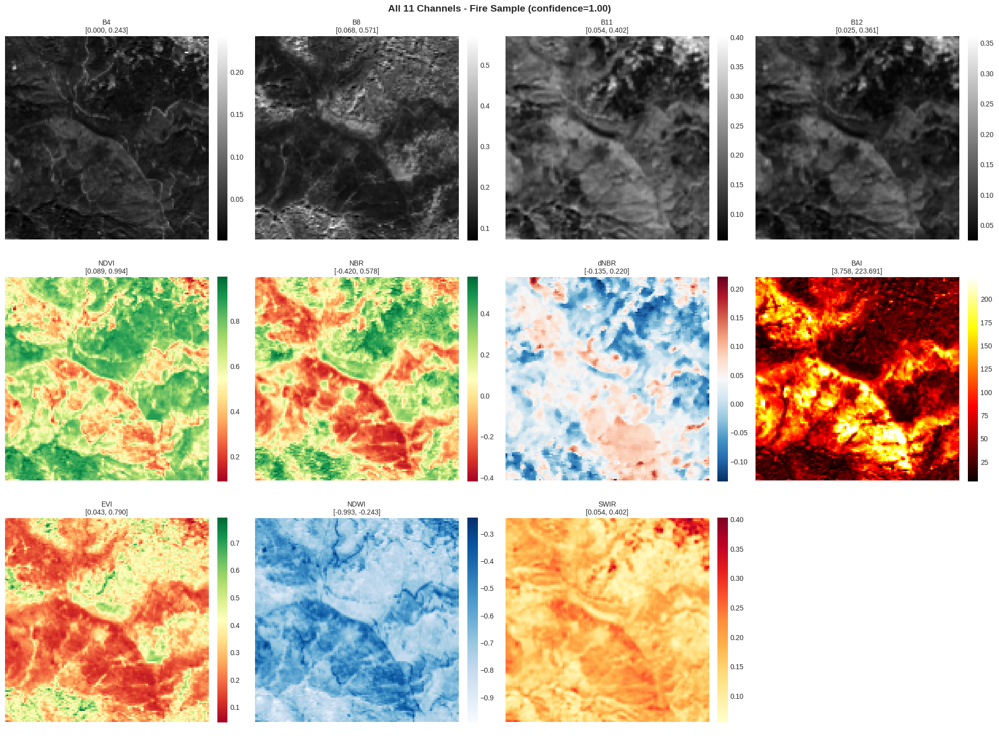

In [16]:
# ══════════════════════════════════════════════════════════════
# EDA 8.2 — All 11 Channels for One Fire Sample
# ══════════════════════════════════════════════════════════════

def eda_all_channels(X, y, means, stds):
    """Show all 11 channels for the highest-confidence fire sample."""
    fire_idx = np.where(y > 0.5)[0]
    best_idx = fire_idx[np.argmax(y[fire_idx])]
    patch = X[best_idx] * stds + means
    cmaps = {'B4': 'gray', 'B8': 'gray', 'B11': 'gray', 'B12': 'gray',
             'NDVI': 'RdYlGn', 'NBR': 'RdYlGn', 'dNBR': 'RdBu_r',
             'BAI': 'hot', 'EVI': 'RdYlGn', 'NDWI': 'Blues', 'SWIR': 'YlOrRd'}
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    fig.suptitle(f'All 11 Channels - Fire Sample (confidence={y[best_idx]:.2f})',
                 fontsize=14, fontweight='bold')
    for i, (ax, name) in enumerate(zip(axes.flat, CHANNEL_NAMES)):
        ch = patch[..., i]
        im = ax.imshow(ch, cmap=cmaps[name])
        ax.set_title(f'{name}\n[{ch.min():.3f}, {ch.max():.3f}]', fontsize=10)
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        ax.axis('off')
    if len(CHANNEL_NAMES) < 12:
        axes.flat[-1].axis('off')
    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}/eda_02_all_channels.png', dpi=150, bbox_inches='tight')
    plt.show()

eda_all_channels(X_train, y_train, CH_MEANS, CH_STDS)

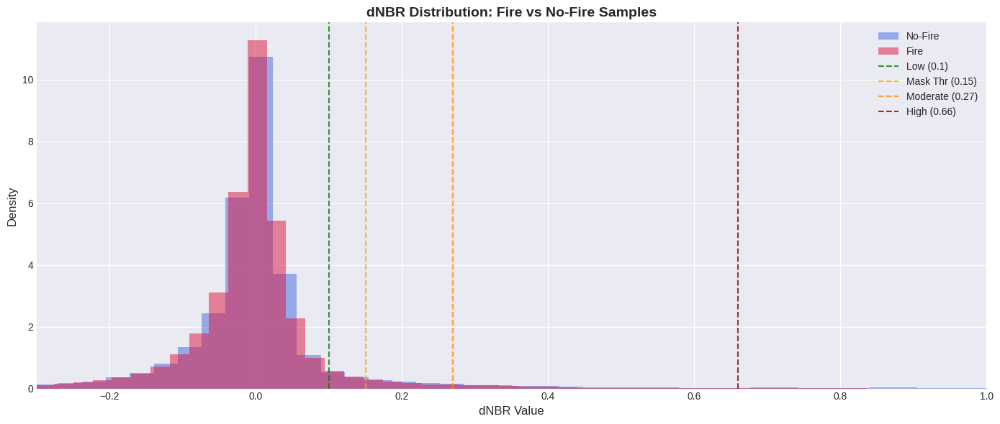

In [17]:
# ══════════════════════════════════════════════════════════════
# EDA 8.3 — dNBR Distribution (THE KEY CHART)
# ══════════════════════════════════════════════════════════════

def eda_dnbr_distribution(X, y, means, stds):
    """Histogram of dNBR values by class with severity thresholds."""
    dNBR_raw = X[..., 6] * stds[6] + means[6]
    fire_mask = y > 0.5
    dNBR_fire = dNBR_raw[fire_mask].flatten()
    dNBR_nofire = dNBR_raw[~fire_mask].flatten()
    n_plot = min(500000, len(dNBR_fire), len(dNBR_nofire))
    if len(dNBR_fire) > n_plot:
        dNBR_fire = np.random.choice(dNBR_fire, n_plot, replace=False)
    if len(dNBR_nofire) > n_plot:
        dNBR_nofire = np.random.choice(dNBR_nofire, n_plot, replace=False)

    fig, ax = plt.subplots(figsize=(14, 6))
    ax.hist(dNBR_nofire, bins=100, alpha=0.5, color='royalblue', label='No-Fire', density=True)
    ax.hist(dNBR_fire, bins=100, alpha=0.5, color='crimson', label='Fire', density=True)
    for thr, label, color in [(0.10, 'Low', 'green'), (0.15, 'Mask Thr', 'orange'),
                               (0.27, 'Moderate', 'darkorange'), (0.66, 'High', 'darkred')]:
        ax.axvline(thr, color=color, linestyle='--', linewidth=1.5, label=f'{label} ({thr})', alpha=0.8)
    ax.set_xlabel('dNBR Value', fontsize=12)
    ax.set_ylabel('Density', fontsize=12)
    ax.set_title('dNBR Distribution: Fire vs No-Fire Samples', fontsize=14, fontweight='bold')
    ax.legend(fontsize=10, loc='upper right')
    ax.set_xlim(-0.3, 1.0)
    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}/eda_03_dnbr_distribution.png', dpi=150, bbox_inches='tight')
    plt.show()

eda_dnbr_distribution(X_train, y_train, CH_MEANS, CH_STDS)

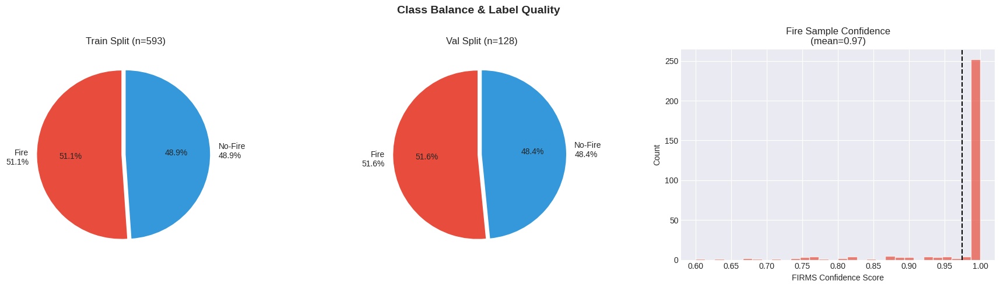

In [18]:
# ══════════════════════════════════════════════════════════════
# EDA 8.4 — Class Balance & Confidence Distribution
# ══════════════════════════════════════════════════════════════

def eda_class_balance(y_train, y_val, y_test):
    """Pie charts for class balance + confidence histogram."""
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle('Class Balance & Label Quality', fontsize=14, fontweight='bold')
    for ax, (y_s, name) in zip(axes[:2], [(y_train, 'Train'), (y_val, 'Val')]):
        fp = np.mean(y_s > 0.5)
        ax.pie([fp, 1-fp], labels=[f'Fire\n{fp:.1%}', f'No-Fire\n{1-fp:.1%}'],
               colors=['#e74c3c', '#3498db'], autopct='%1.1f%%', startangle=90, explode=(0.05, 0))
        ax.set_title(f'{name} Split (n={len(y_s)})')
    fire_conf = y_train[y_train > 0.5]
    axes[2].hist(fire_conf, bins=30, color='#e74c3c', alpha=0.7, edgecolor='white')
    axes[2].set_xlabel('FIRMS Confidence Score')
    axes[2].set_ylabel('Count')
    axes[2].set_title(f'Fire Sample Confidence\n(mean={fire_conf.mean():.2f})')
    axes[2].axvline(fire_conf.mean(), color='black', linestyle='--', linewidth=1.5)
    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}/eda_04_class_balance.png', dpi=150, bbox_inches='tight')
    plt.show()

eda_class_balance(y_train, y_val, y_test)

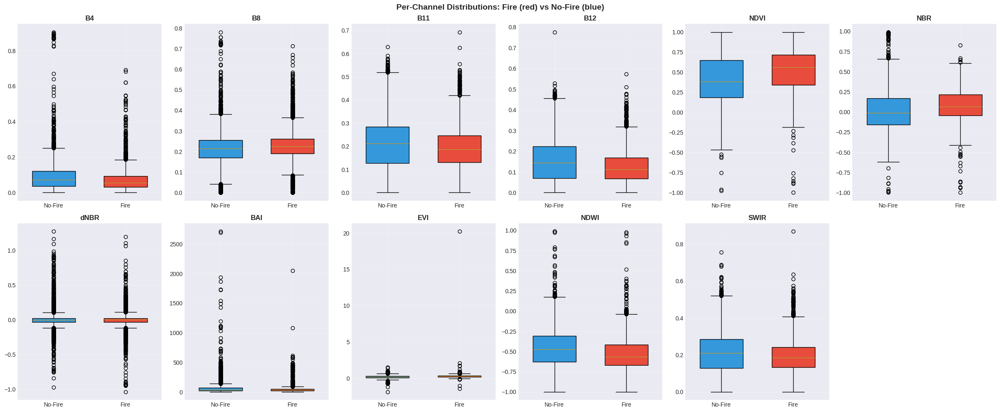

In [19]:
# ══════════════════════════════════════════════════════════════
# EDA 8.5 — Per-Channel Box Plots
# ══════════════════════════════════════════════════════════════

def eda_channel_boxplots(X, y, means, stds):
    """Side-by-side box plots for all 11 channels, fire vs no-fire."""
    X_raw = X * stds + means
    fire_mask = y > 0.5
    fig, axes = plt.subplots(2, 6, figsize=(24, 10))
    fig.suptitle('Per-Channel Distributions: Fire (red) vs No-Fire (blue)', fontsize=14, fontweight='bold')
    for i, (ax, name) in enumerate(zip(axes.flat, CHANNEL_NAMES)):
        n_sub = 5000
        fp = X_raw[fire_mask][..., i].flatten()
        nfp = X_raw[~fire_mask][..., i].flatten()
        fs = np.random.choice(fp, min(n_sub, len(fp)), replace=False)
        nfs = np.random.choice(nfp, min(n_sub, len(nfp)), replace=False)
        bp = ax.boxplot([nfs, fs], labels=['No-Fire', 'Fire'], patch_artist=True, widths=0.6)
        bp['boxes'][0].set_facecolor('#3498db')
        bp['boxes'][1].set_facecolor('#e74c3c')
        ax.set_title(name, fontweight='bold')
        ax.grid(True, alpha=0.3)
    axes.flat[-1].axis('off')
    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}/eda_05_channel_boxplots.png', dpi=150, bbox_inches='tight')
    plt.show()

eda_channel_boxplots(X_train, y_train, CH_MEANS, CH_STDS)

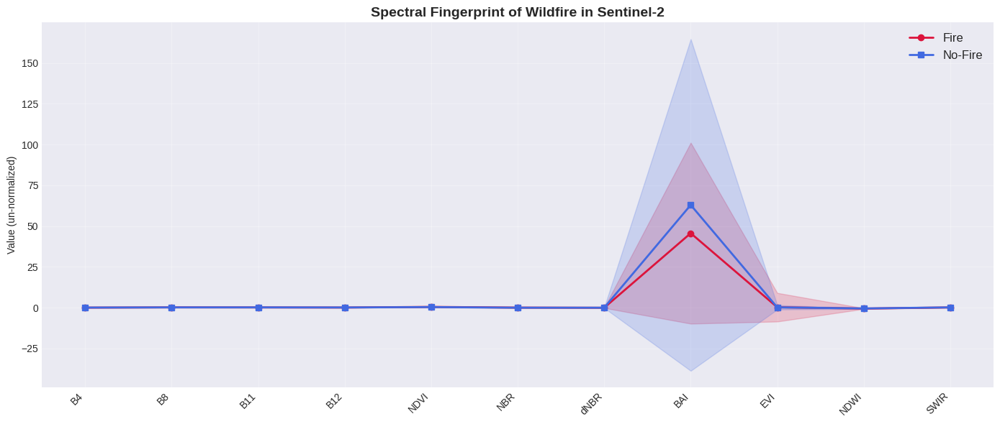

In [20]:
# ══════════════════════════════════════════════════════════════
# EDA 8.6 — Spectral Signature Plot
# ══════════════════════════════════════════════════════════════

def eda_spectral_signature(X, y, means, stds):
    """Mean +/- std per channel for fire vs no-fire."""
    X_raw = X * stds + means
    fire_mask = y > 0.5
    fm = [X_raw[fire_mask][..., i].mean() for i in range(11)]
    fs = [X_raw[fire_mask][..., i].std() for i in range(11)]
    nm = [X_raw[~fire_mask][..., i].mean() for i in range(11)]
    ns = [X_raw[~fire_mask][..., i].std() for i in range(11)]
    x_pos = np.arange(11)
    fig, ax = plt.subplots(figsize=(14, 6))
    ax.plot(x_pos, fm, 'o-', color='crimson', label='Fire', linewidth=2)
    ax.fill_between(x_pos, np.array(fm)-np.array(fs), np.array(fm)+np.array(fs), alpha=0.2, color='crimson')
    ax.plot(x_pos, nm, 's-', color='royalblue', label='No-Fire', linewidth=2)
    ax.fill_between(x_pos, np.array(nm)-np.array(ns), np.array(nm)+np.array(ns), alpha=0.2, color='royalblue')
    ax.set_xticks(x_pos)
    ax.set_xticklabels(CHANNEL_NAMES, rotation=45, ha='right')
    ax.set_ylabel('Value (un-normalized)')
    ax.set_title('Spectral Fingerprint of Wildfire in Sentinel-2', fontsize=14, fontweight='bold')
    ax.legend(fontsize=12)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}/eda_06_spectral_signature.png', dpi=150, bbox_inches='tight')
    plt.show()

eda_spectral_signature(X_train, y_train, CH_MEANS, CH_STDS)

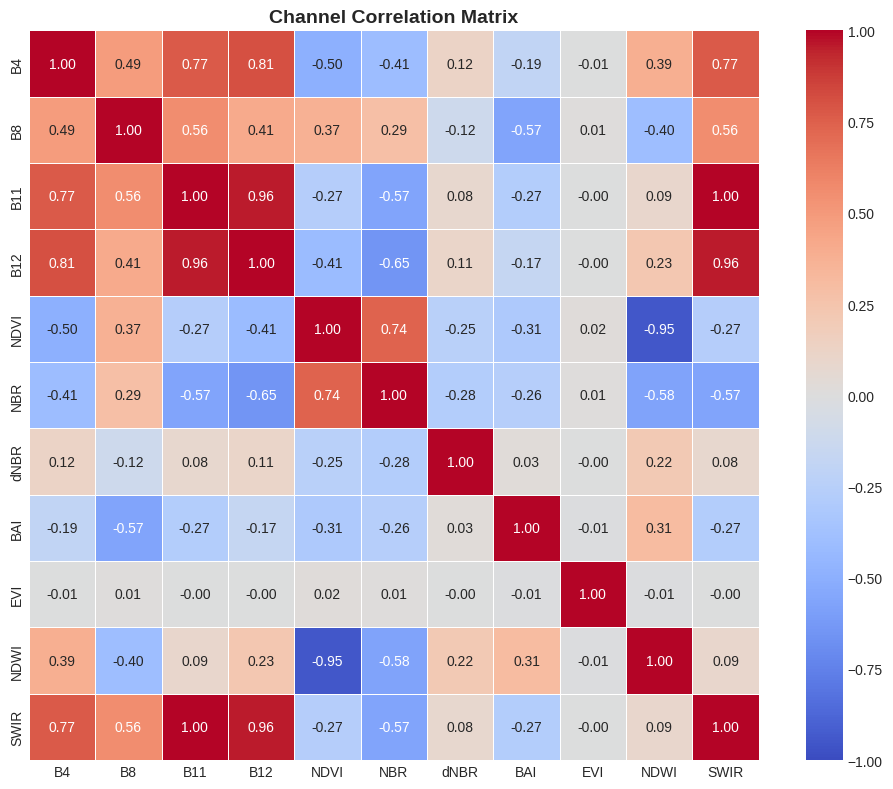

In [21]:
# ══════════════════════════════════════════════════════════════
# EDA 8.7 — Channel Correlation Heatmap
# ══════════════════════════════════════════════════════════════

def eda_correlation_heatmap(X):
    """11x11 correlation matrix across all channels."""
    N = X.shape[0]
    n_sub = min(200, N)
    idx = np.random.choice(N, n_sub, replace=False)
    flat = X[idx].reshape(-1, 11)
    corr = np.corrcoef(flat.T)
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm',
                xticklabels=CHANNEL_NAMES, yticklabels=CHANNEL_NAMES,
                vmin=-1, vmax=1, ax=ax, square=True, linewidths=0.5)
    ax.set_title('Channel Correlation Matrix', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}/eda_07_correlation_heatmap.png', dpi=150, bbox_inches='tight')
    plt.show()

eda_correlation_heatmap(X_train)

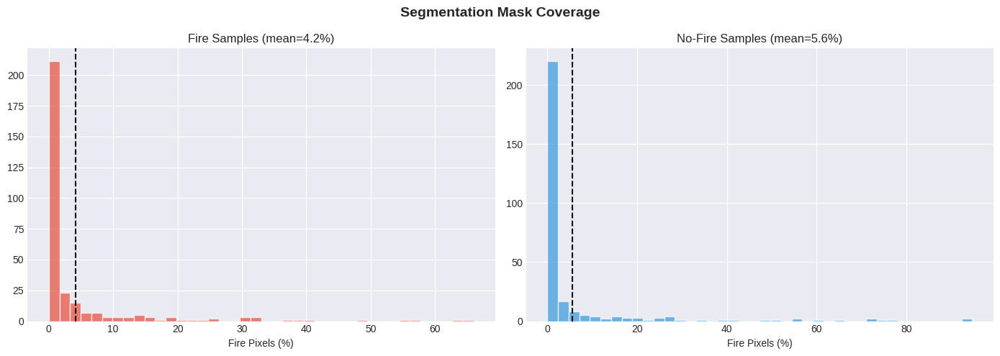

This justifies using Dice + Focal loss (pixel-level class imbalance).


In [22]:
# ══════════════════════════════════════════════════════════════
# EDA 8.8 — Mask Coverage Distribution
# ══════════════════════════════════════════════════════════════

def eda_mask_coverage(X, y, means, stds):
    """Histogram of fire pixel percentage per sample."""
    dNBR_raw = X[..., 6] * stds[6] + means[6]
    masks = (dNBR_raw > CFG['MASK_DNBR_THR']).astype(np.float32)
    fire_mask = y > 0.5
    per_sample_pct = masks.mean(axis=(1, 2)) * 100
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('Segmentation Mask Coverage', fontsize=14, fontweight='bold')
    axes[0].hist(per_sample_pct[fire_mask], bins=40, color='#e74c3c', alpha=0.7, edgecolor='white')
    axes[0].axvline(per_sample_pct[fire_mask].mean(), color='black', linestyle='--')
    axes[0].set_xlabel('Fire Pixels (%)')
    axes[0].set_title(f'Fire Samples (mean={per_sample_pct[fire_mask].mean():.1f}%)')
    axes[1].hist(per_sample_pct[~fire_mask], bins=40, color='#3498db', alpha=0.7, edgecolor='white')
    axes[1].axvline(per_sample_pct[~fire_mask].mean(), color='black', linestyle='--')
    axes[1].set_xlabel('Fire Pixels (%)')
    axes[1].set_title(f'No-Fire Samples (mean={per_sample_pct[~fire_mask].mean():.1f}%)')
    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}/eda_08_mask_coverage.png', dpi=150, bbox_inches='tight')
    plt.show()
    print('This justifies using Dice + Focal loss (pixel-level class imbalance).')

eda_mask_coverage(X_train, y_train, CH_MEANS, CH_STDS)

## Section 12 — Segmentation Mask Generation

**Critical**: Mask threshold = `0.15`, NOT `0.27`.
At 128px patches, 0.27 produces <5% fire pixels per mask causing all-zero collapse.
We must un-normalize dNBR BEFORE thresholding.

In [23]:
# ══════════════════════════════════════════════════════════════
# Section 12 — Mask Generation
# ══════════════════════════════════════════════════════════════

def make_masks(X_norm, means, stds, threshold=0.15):
    """Generate binary fire masks from dNBR. Un-normalizes dNBR first."""
    dNBR_raw = X_norm[..., 6] * stds[6] + means[6]
    masks = (dNBR_raw > threshold).astype(np.float32)
    return masks[..., np.newaxis]

M_train = make_masks(X_train, CH_MEANS, CH_STDS, CFG['MASK_DNBR_THR'])
M_val   = make_masks(X_val,   CH_MEANS, CH_STDS, CFG['MASK_DNBR_THR'])
M_test  = make_masks(X_test,  CH_MEANS, CH_STDS, CFG['MASK_DNBR_THR'])

print('='*60)
print('MASK GENERATION VALIDATION')
print('='*60)
print(f'  Fire pixel % train: {M_train.mean():.3%}')
print(f'  Fire pixel % val:   {M_val.mean():.3%}')
print(f'  Fire pixel % test:  {M_test.mean():.3%}')
print(f'  Shapes: M_train={M_train.shape}, M_val={M_val.shape}, M_test={M_test.shape}')

if M_train.mean() < 0.05:
    print('  WARNING: Fire pixel ratio below 5%! Lowering threshold to 0.10...')
    CFG['MASK_DNBR_THR'] = 0.10
    M_train = make_masks(X_train, CH_MEANS, CH_STDS, CFG['MASK_DNBR_THR'])
    M_val   = make_masks(X_val,   CH_MEANS, CH_STDS, CFG['MASK_DNBR_THR'])
    M_test  = make_masks(X_test,  CH_MEANS, CH_STDS, CFG['MASK_DNBR_THR'])
    print(f'  New fire pixel % train: {M_train.mean():.3%}')
elif M_train.mean() > 0.40:
    print('  WARNING: Fire pixel ratio above 40% - check normalization!')
else:
    print('  Mask fire pixel ratio is in healthy range (5-40%)')

MASK GENERATION VALIDATION
  Fire pixel % train: 4.884%
  Fire pixel % val:   6.858%
  Fire pixel % test:  6.971%
  Shapes: M_train=(593, 128, 128, 1), M_val=(128, 128, 128, 1), M_test=(128, 128, 128, 1)
  New fire pixel % train: 7.039%


## Section 13 — tf.data Augmentation Pipelines

**NEVER materialize augmented arrays in RAM.** At 128x128x11xfloat32, one sample = 704KB.
1255 samples x 5 augmentations = 4.4 GB. This crashes Colab. Use tf.data instead.

Spatial transforms must be **identical** for X and mask M (concatenate trick).

In [24]:
# ══════════════════════════════════════════════════════════════
# Section 13 — tf.data Augmentation Pipelines
# ══════════════════════════════════════════════════════════════

def augment_clf(X, y):
    """On-the-fly augmentation for classification."""
    X = tf.image.random_flip_left_right(X)
    X = tf.image.random_flip_up_down(X)
    k = tf.random.uniform([], 0, 4, dtype=tf.int32)
    X = tf.image.rot90(X, k)
    X = X + tf.random.normal(tf.shape(X), 0.0, 0.02)
    return X, y

def augment_seg(X, M):
    """On-the-fly augmentation for segmentation. Concatenate trick for sync."""
    combined = tf.concat([X, M], axis=-1)
    combined = tf.image.random_flip_left_right(combined)
    combined = tf.image.random_flip_up_down(combined)
    k = tf.random.uniform([], 0, 4, dtype=tf.int32)
    combined = tf.image.rot90(combined, k)
    X_aug = combined[..., :11]
    M_aug = combined[..., 11:]
    X_aug = X_aug + tf.random.normal(tf.shape(X_aug), 0.0, 0.02)
    return X_aug, M_aug

def make_dataset(X, y_or_M, batch_size, augment_fn=None, shuffle=True):
    """Create a tf.data.Dataset pipeline."""
    ds = tf.data.Dataset.from_tensor_slices((X, y_or_M))
    if shuffle:
        ds = ds.shuffle(len(X), reshuffle_each_iteration=True)
    if augment_fn is not None:
        ds = ds.map(augment_fn, num_parallel_calls=tf.data.AUTOTUNE)
    return ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

train_clf_ds = make_dataset(X_train, y_train, 32, augment_clf, shuffle=True)
val_clf_ds   = make_dataset(X_val,   y_val,   32, shuffle=False)
test_clf_ds  = make_dataset(X_test,  y_test,  32, shuffle=False)

train_seg_ds = make_dataset(X_train, M_train, 8, augment_seg, shuffle=True)
val_seg_ds   = make_dataset(X_val,   M_val,   8, shuffle=False)
test_seg_ds  = make_dataset(X_test,  M_test,  8, shuffle=False)

print('tf.data pipelines created.')
print(f'   Classification: batch=32, Segmentation: batch=8')

tf.data pipelines created.
   Classification: batch=32, Segmentation: batch=8


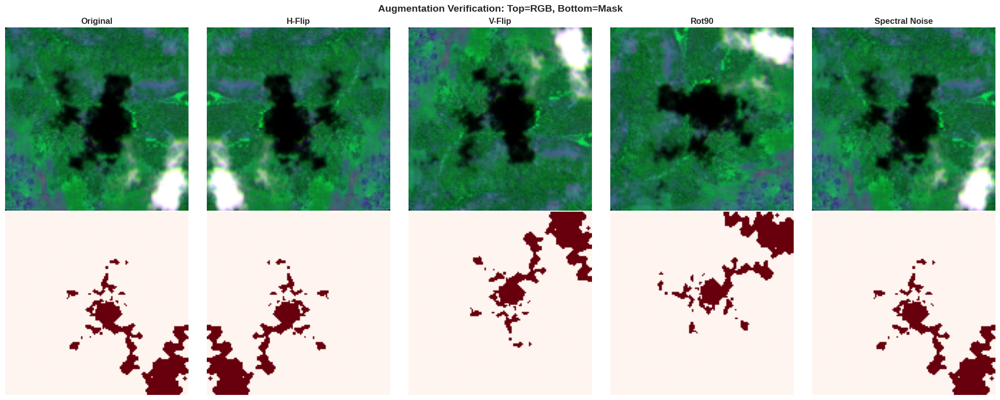

In [25]:
# ══════════════════════════════════════════════════════════════
# Section 14 — Augmentation Visualization
# ══════════════════════════════════════════════════════════════

def viz_augmentations(X_train, M_train, means, stds):
    """Show one fire sample through all augmentation transforms."""
    fire_idx = np.where(M_train.mean(axis=(1, 2, 3)) > 0.05)[0]
    if len(fire_idx) == 0:
        fire_idx = np.arange(len(X_train))
    idx = fire_idx[0]
    X_s = X_train[idx].copy()
    M_s = M_train[idx].copy()

    fig, axes = plt.subplots(2, 5, figsize=(20, 8))
    fig.suptitle('Augmentation Verification: Top=RGB, Bottom=Mask', fontsize=14, fontweight='bold')
    titles = ['Original', 'H-Flip', 'V-Flip', 'Rot90', 'Spectral Noise']
    for col, title in enumerate(titles):
        X_aug, M_aug = X_s.copy(), M_s.copy()
        if col == 1:
            X_aug, M_aug = X_aug[:, ::-1, :], M_aug[:, ::-1, :]
        elif col == 2:
            X_aug, M_aug = X_aug[::-1, :, :], M_aug[::-1, :, :]
        elif col == 3:
            X_aug, M_aug = np.rot90(X_aug, 1), np.rot90(M_aug, 1)
        elif col == 4:
            X_aug = X_aug + np.random.normal(0, 0.02, X_aug.shape).astype(np.float32)
        patch = X_aug * stds + means
        rgb = patch[..., [0, 1, 2]].copy()
        for c in range(3):
            p2, p98 = np.percentile(rgb[..., c], [2, 98])
            rgb[..., c] = np.clip((rgb[..., c]-p2)/(p98-p2+1e-8), 0, 1)
        axes[0, col].imshow(rgb)
        axes[0, col].set_title(title, fontweight='bold')
        axes[0, col].axis('off')
        axes[1, col].imshow(M_aug[..., 0], cmap='Reds', vmin=0, vmax=1)
        axes[1, col].axis('off')
    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}/viz_augmentations.png', dpi=150, bbox_inches='tight')
    plt.show()

viz_augmentations(X_train, M_train, CH_MEANS, CH_STDS)

## Section 15 — Classification: 3 Model Comparison

All models trained **from scratch** (no ImageNet pretrained weights).
Satellite spectral features (11 channels, dNBR, BAI, NDWI at 20m) have zero
overlap with natural image statistics. Our experiments confirmed: lightweight CNN
from scratch matched EfficientNetV2S (AUC 0.875 each).

| Model | Params | Design rationale |
|-------|--------|-----------------|
| A - Lightweight CNN | ~474K | Proven baseline, right-sized |
| B - ResNet | ~5M | Tests if skip connections help |
| C - MobileNet-style | ~319K | Most efficient, depthwise separable |

In [26]:
# ══════════════════════════════════════════════════════════════
# Section 15 — Classification Architectures
# ══════════════════════════════════════════════════════════════

INPUT_SHAPE = (CFG['PATCH_SIZE'], CFG['PATCH_SIZE'], CFG['N_CHANNELS'])

def build_clf_cnn():
    """Lightweight CNN - ~474K params."""
    inp = Input(shape=INPUT_SHAPE, name='input')
    x = Conv2D(32, 3, padding='same', use_bias=False)(inp)
    x = BatchNormalization()(x); x = ReLU()(x)
    x = Conv2D(32, 3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x); x = ReLU()(x)
    x = MaxPooling2D(2)(x); x = Dropout(0.2)(x)

    x = Conv2D(64, 3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x); x = ReLU()(x)
    x = Conv2D(64, 3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x); x = ReLU()(x)
    x = MaxPooling2D(2)(x); x = Dropout(0.2)(x)

    x = Conv2D(128, 3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x); x = ReLU()(x)
    x = Conv2D(128, 3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x); x = ReLU()(x)
    x = MaxPooling2D(2)(x); x = Dropout(0.3)(x)

    x = Conv2D(256, 3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x); x = ReLU()(x)
    x = MaxPooling2D(2)(x)

    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x); x = Dropout(0.4)(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(1, activation='sigmoid', name='output')(x)
    return Model(inp, x, name='LightweightCNN')


def residual_block_clf(x, filters):
    """Residual block with projection shortcut."""
    shortcut = Conv2D(filters, 1, padding='same')(x)
    shortcut = BatchNormalization()(shortcut)
    x = Conv2D(filters, 3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x); x = ReLU()(x)
    x = Conv2D(filters, 3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    return ReLU()(Add()([x, shortcut]))

def build_clf_resnet():
    """ResNet-style classifier - ~5M params."""
    inp = Input(shape=INPUT_SHAPE, name='input')
    x = Conv2D(64, 7, strides=2, padding='same', use_bias=False)(inp)
    x = BatchNormalization()(x); x = ReLU()(x)
    x = MaxPooling2D(3, strides=2, padding='same')(x)
    x = residual_block_clf(x, 64); x = MaxPooling2D(2)(x)
    x = residual_block_clf(x, 128); x = MaxPooling2D(2)(x)
    x = residual_block_clf(x, 256); x = MaxPooling2D(2)(x)
    x = residual_block_clf(x, 512); x = MaxPooling2D(2)(x)
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x); x = Dropout(0.4)(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(1, activation='sigmoid', name='output')(x)
    return Model(inp, x, name='ResNet')


def depthwise_block(x, filters, stride=1):
    """Depthwise separable conv block."""
    x = DepthwiseConv2D(3, strides=stride, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x); x = ReLU()(x)
    x = Conv2D(filters, 1, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x); x = ReLU()(x)
    return x

def build_clf_mobilenet():
    """MobileNet-style classifier - ~319K params."""
    inp = Input(shape=INPUT_SHAPE, name='input')
    x = Conv2D(32, 3, padding='same', use_bias=False)(inp)
    x = BatchNormalization()(x); x = ReLU()(x)
    x = depthwise_block(x, 64, stride=2)
    x = depthwise_block(x, 128, stride=2)
    x = depthwise_block(x, 256, stride=2)
    x = depthwise_block(x, 512, stride=1)
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x); x = Dropout(0.3)(x)
    x = Dense(1, activation='sigmoid', name='output')(x)
    return Model(inp, x, name='MobileNetStyle')

print('Classification architectures defined.')

Classification architectures defined.


In [27]:
# ══════════════════════════════════════════════════════════════
# Train & Compare All 3 Classifiers
# ══════════════════════════════════════════════════════════════

def train_classifier(build_fn, name, train_ds, val_ds, save_path):
    """Train a classification model and return results dict."""
    print(f'\n{"="*60}')
    print(f'Training {name}')
    print(f'{"="*60}')
    keras.backend.clear_session()
    gc.collect()

    model = build_fn()
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=CFG['LR']),
        loss='binary_crossentropy',
        metrics=[keras.metrics.AUC(name='auc'),
                 keras.metrics.Precision(name='precision'),
                 keras.metrics.Recall(name='recall')])
    model.summary()

    callbacks = [
        EarlyStopping(monitor='val_auc', patience=15, mode='max', restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_auc', patience=7, factor=0.5, min_lr=1e-7, mode='max', verbose=1),
        ModelCheckpoint(save_path, monitor='val_auc', save_best_only=True, mode='max', verbose=1)]

    start_time = time.time()
    history = model.fit(train_ds, validation_data=val_ds, epochs=CFG['EPOCHS'], callbacks=callbacks, verbose=1)
    train_time = time.time() - start_time

    # Optimal threshold via Youden J statistic
    val_probs = model.predict(X_val).flatten()
    y_val_bin = (y_val >= 0.5).astype(int)
    fpr, tpr, thresholds = roc_curve(y_val_bin, val_probs)
    opt_idx = np.argmax(tpr - fpr)
    opt_threshold = thresholds[opt_idx]

    val_preds = (val_probs >= opt_threshold).astype(int)
    auc = roc_auc_score(y_val_bin, val_probs)
    f1 = f1_score(y_val_bin, val_preds)
    prec = precision_score(y_val_bin, val_preds)
    rec = recall_score(y_val_bin, val_preds)

    results = {'name': name, 'model': model, 'history': history.history,
               'auc': auc, 'f1': f1, 'precision': prec, 'recall': rec,
               'threshold': opt_threshold, 'params': model.count_params(),
               'time': train_time, 'fpr': fpr, 'tpr': tpr, 'val_probs': val_probs}

    print(f'\n{name} Results: AUC={auc:.4f} F1={f1:.4f} Prec={prec:.4f} Rec={rec:.4f} '
          f'Thr={opt_threshold:.4f} Params={model.count_params():,} Time={train_time:.0f}s')
    return results

clf_builders = [
    (build_clf_cnn,       'LightweightCNN',   f'{SAVE_DIR}/clf_cnn.keras'),
    (build_clf_resnet,    'ResNet',            f'{SAVE_DIR}/clf_resnet.keras'),
    (build_clf_mobilenet, 'MobileNetStyle',    f'{SAVE_DIR}/clf_mobilenet.keras')]

clf_results = []
for build_fn, name, path in clf_builders:
    try:
        result = train_classifier(build_fn, name, train_clf_ds, val_clf_ds, path)
        clf_results.append(result)
    except Exception as e:
        print(f'{name} training failed: {e}')
    keras.backend.clear_session()
    gc.collect()


Training LightweightCNN


Model: "LightweightCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 128, 128, 11)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │         3,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 32)   │         9,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 64)     │        18,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_2 (ReLU)                  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 64)     │        36,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_3 (ReLU)                  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_4 (ReLU)                  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 128)    │       147,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │             

 Total params: 668,897 (2.55 MB)

 Trainable params: 667,489 (2.55 MB)

 Non-trainable params: 1,408 (5.50 KB)

Epoch 1/80
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 739ms/step - auc: 0.6154 - loss: 0.7000 - precision: 0.6089 - recall: 0.6780
Epoch 1: val_auc improved from None to 0.66031, saving model to /content/drive/MyDrive/wildfire_system_v3/clf_cnn.keras

Epoch 1: finished saving model to /content/drive/MyDrive/wildfire_system_v3/clf_cnn.keras
19/19 ━━━━━━━━━━━━━━━━━━━━ 36s 837ms/step - auc: 0.6370 - loss: 0.6780 - precision: 0.6039 - recall: 0.7096 - val_auc: 0.6603 - val_loss: 2.2453 - val_precision: 0.8000 - val_recall: 0.0606 - learning_rate: 0.0010
Epoch 2/80
18/19 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - auc: 0.6195 - loss: 0.6759 - precision: 0.6100 - recall: 0.6865
Epoch 2: val_auc did not improve from 0.66031
19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - auc: 0.6151 - loss: 0.6671 - precision: 0.5950 - recall: 0.7129 - val_auc: 0.6547 - val_loss: 7.3368 - val_precision: 0.6296 - val_recall: 0.2576 - learning_rate: 0.0010
Epoch 3/80
18/19 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - auc: 0.6736 - loss: 0.6791 -

Model: "ResNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 128, 128,  │          0 │ -                 │
│                     │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 64, 64,    │     34,496 │ input[0][0]       │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 64, 64,    │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 64, 64,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 32, 32,    │          0 │ re_lu[0][0]       │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 32, 32,    │     36,864 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 32, 32,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 32, 32,    │     36,864 │ re_lu_1[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 32, 32,    │      4,160 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 32, 32,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 32, 32,    │          0 │ add[0][0]         │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 16, 16,    │          0 │ re_lu_2[0][0]     │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 16, 16,    │     73,728 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │        512 │ conv2d_5[0][0]  

 Total params: 5,089,793 (19.42 MB)

 Trainable params: 5,083,905 (19.39 MB)

 Non-trainable params: 5,888 (23.00 KB)

Epoch 1/80
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 620ms/step - auc: 0.5645 - loss: 0.9702 - precision: 0.5429 - recall: 0.6228
Epoch 1: val_auc improved from None to 0.41960, saving model to /content/drive/MyDrive/wildfire_system_v3/clf_resnet.keras

Epoch 1: finished saving model to /content/drive/MyDrive/wildfire_system_v3/clf_resnet.keras
19/19 ━━━━━━━━━━━━━━━━━━━━ 33s 757ms/step - auc: 0.5719 - loss: 0.8994 - precision: 0.5533 - recall: 0.6337 - val_auc: 0.4196 - val_loss: 1.2964 - val_precision: 0.4818 - val_recall: 0.8030 - learning_rate: 0.0010
Epoch 2/80
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - auc: 0.6433 - loss: 0.7687 - precision: 0.6547 - recall: 0.5501
Epoch 2: val_auc improved from 0.41960 to 0.59042, saving model to /content/drive/MyDrive/wildfire_system_v3/clf_resnet.keras

Epoch 2: finished saving model to /content/drive/MyDrive/wildfire_system_v3/clf_resnet.keras
19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - auc: 0.6223 - loss: 0.7500 - precision: 0.5947 - recall: 0.6634 - val_

Model: "MobileNetStyle"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 128, 128, 11)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │         3,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depthwise_conv2d                │ (None, 64, 64, 32)     │           288 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_2 (ReLU)                  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depthwise_conv2d_1              │ (None, 32, 32, 64)     │           576 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_3 (ReLU)                  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_4 (ReLU)                  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depthwise_conv2d_2              │ (None, 16, 16, 128)    │         1,152 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_5 (ReLU)                  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 256)    │        32,768 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 319,041 (1.22 MB)

 Trainable params: 316,097 (1.21 MB)

 Non-trainable params: 2,944 (11.50 KB)

Epoch 1/80
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - auc: 0.5865 - loss: 0.7040 - precision: 0.5022 - recall: 0.4899
Epoch 1: val_auc improved from None to 0.50000, saving model to /content/drive/MyDrive/wildfire_system_v3/clf_mobilenet.keras

Epoch 1: finished saving model to /content/drive/MyDrive/wildfire_system_v3/clf_mobilenet.keras
19/19 ━━━━━━━━━━━━━━━━━━━━ 38s 966ms/step - auc: 0.6228 - loss: 0.6931 - precision: 0.5815 - recall: 0.6007 - val_auc: 0.5000 - val_loss: 0.6932 - val_precision: 0.5156 - val_recall: 1.0000 - learning_rate: 0.0010
Epoch 2/80
18/19 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - auc: 0.7044 - loss: 0.6187 - precision: 0.6361 - recall: 0.7291
Epoch 2: val_auc did not improve from 0.50000
19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - auc: 0.6933 - loss: 0.6256 - precision: 0.6292 - recall: 0.7393 - val_auc: 0.5000 - val_loss: 0.6936 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 3/80
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - auc: 0.7


CLASSIFICATION MODEL COMPARISON
Model                     AUC       F1     Prec   Recall      Thr     Params   Time
--------------------------------------------------------------------------------
LightweightCNN         0.7561   0.7049   0.7679   0.6515   0.6066    668,897    119s
ResNet                 0.7761   0.7445   0.7183   0.7727   0.4604  5,089,793    186s
MobileNetStyle         0.8284   0.8000   0.8125   0.7879   0.8309    319,041    249s

BEST CLASSIFIER: MobileNetStyle (AUC=0.8284)


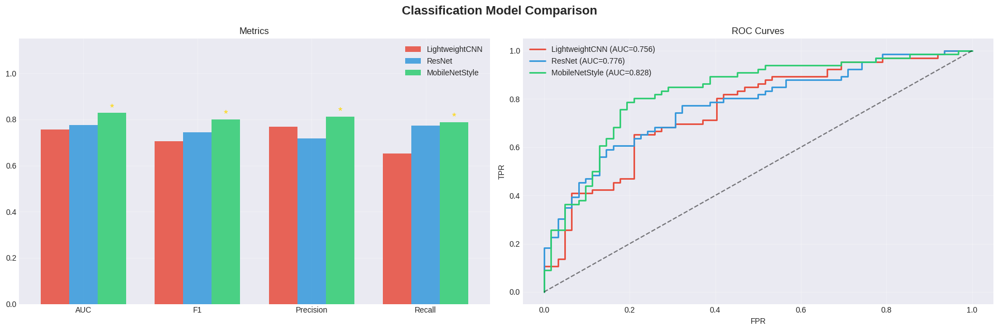

In [28]:
# ══════════════════════════════════════════════════════════════
# Classification Comparison & Best Model
# ══════════════════════════════════════════════════════════════

print('\n' + '='*80)
print('CLASSIFICATION MODEL COMPARISON')
print('='*80)
print(f'{"Model":<20} {"AUC":>8} {"F1":>8} {"Prec":>8} {"Recall":>8} {"Thr":>8} {"Params":>10} {"Time":>6}')
print('-'*80)
best_clf_idx, best_auc = 0, 0
for i, r in enumerate(clf_results):
    if r['auc'] > best_auc:
        best_auc = r['auc']
        best_clf_idx = i
    print(f'{r["name"]:<20} {r["auc"]:8.4f} {r["f1"]:8.4f} {r["precision"]:8.4f} '
          f'{r["recall"]:8.4f} {r["threshold"]:8.4f} {r["params"]:>10,} {r["time"]:6.0f}s')

best_clf = clf_results[best_clf_idx]
print(f'\nBEST CLASSIFIER: {best_clf["name"]} (AUC={best_clf["auc"]:.4f})')
best_clf['model'].save(CFG['BEST_CLF_PATH'])
best_clf_threshold = best_clf['threshold']

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('Classification Model Comparison', fontsize=16, fontweight='bold')
metrics_names = ['AUC', 'F1', 'Precision', 'Recall']
x_pos = np.arange(len(metrics_names))
width = 0.25
colors = ['#e74c3c', '#3498db', '#2ecc71']
for i, r in enumerate(clf_results):
    vals = [r['auc'], r['f1'], r['precision'], r['recall']]
    bars = axes[0].bar(x_pos + i*width, vals, width, label=r['name'], color=colors[i], alpha=0.85)
    if i == best_clf_idx:
        for bar in bars:
            axes[0].text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.01, '*', ha='center', fontsize=14, color='gold')
axes[0].set_xticks(x_pos + width); axes[0].set_xticklabels(metrics_names)
axes[0].set_ylim(0, 1.15); axes[0].legend(); axes[0].set_title('Metrics'); axes[0].grid(True, alpha=0.3)

for i, r in enumerate(clf_results):
    axes[1].plot(r['fpr'], r['tpr'], label=f'{r["name"]} (AUC={r["auc"]:.3f})', color=colors[i], linewidth=2)
axes[1].plot([0,1],[0,1],'k--',alpha=0.5)
axes[1].set_xlabel('FPR'); axes[1].set_ylabel('TPR'); axes[1].set_title('ROC Curves')
axes[1].legend(); axes[1].grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(f'{SAVE_DIR}/clf_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

## Section 16 — Segmentation: Custom Losses + 3 Model Comparison

Standard BCE fails because fire pixels are a minority (8-20%). Must use:
- **Focal Loss** (gamma=2, alpha=0.75): focuses on hard examples
- **Dice Loss**: directly optimizes spatial overlap
- **Combined**: 50% Focal + 50% Dice

| Model | Params | Design |
|-------|--------|--------|
| Compact UNet | ~1.8M | Bottleneck=256, sized for ~1000 samples |
| ResUNet | ~2.4M | Residual encoder for gradient flow |
| DeepLabV3+ | ~2.1M | ASPP for multi-scale burn patterns |

In [32]:
def _sq(t):
    """[B,H,W,1] or [B,H,W] -> flattened float32. Handles both mask shapes."""
    t = tf.cast(t, tf.float32)
    if len(t.shape) == 4 and t.shape[-1] == 1:
        t = tf.squeeze(t, axis=-1)
    return t


def dice_loss(y_true, y_pred, smooth=1e-6):
    """Dice loss - optimizes spatial overlap."""
    yt = tf.keras.backend.flatten(_sq(y_true))
    yp = tf.keras.backend.flatten(_sq(y_pred))
    inter = tf.reduce_sum(yt * yp)
    return 1.0 - (2.0 * inter + smooth) / (tf.reduce_sum(yt) + tf.reduce_sum(yp) + smooth)


def focal_loss(y_true, y_pred, gamma=2.0, alpha=0.75):
    """Focal loss - focuses on hard examples, upweights rare class.
    Uses raw per-pixel BCE formula instead of tf.keras.losses.binary_crossentropy,
    which collapses spatial dims on 3D inputs ([B,H,W] -> [B,H]).
    """
    yt = _sq(y_true)                                     # [B,H,W]
    yp = tf.clip_by_value(_sq(y_pred), 1e-7, 1-1e-7)   # [B,H,W]
    bce = -(yt * tf.math.log(yp) + (1.0 - yt) * tf.math.log(1.0 - yp))  # [B,H,W]
    p_t = yt * yp + (1.0 - yt) * (1.0 - yp)            # [B,H,W]
    focal_weight = alpha * tf.pow(1.0 - p_t, gamma)     # [B,H,W]
    return tf.reduce_mean(focal_weight * bce)            # scalar


def combined_loss(y_true, y_pred):
    """50% Focal + 50% Dice."""
    return 0.5 * focal_loss(y_true, y_pred) + 0.5 * dice_loss(y_true, y_pred)


def iou_score(y_true, y_pred, thr=0.5):
    """Intersection over Union metric."""
    yp = tf.cast(_sq(y_pred) >= thr, tf.float32)
    yt = _sq(y_true)
    inter = tf.reduce_sum(yt * yp)
    union = tf.reduce_sum(yt) + tf.reduce_sum(yp) - inter
    return inter / (union + 1e-6)


def dice_coef(y_true, y_pred, smooth=1e-6):
    """Dice coefficient metric."""
    yt = tf.keras.backend.flatten(_sq(y_true))
    yp = tf.keras.backend.flatten(_sq(y_pred))
    inter = tf.reduce_sum(yt * yp)
    return (2.0 * inter + smooth) / (tf.reduce_sum(yt) + tf.reduce_sum(yp) + smooth)


print('Segmentation losses defined: focal, dice, combined')

Segmentation losses defined: focal, dice, combined


In [33]:
# ══════════════════════════════════════════════════════════════
# Section 16b — Segmentation Architectures
# ══════════════════════════════════════════════════════════════

def conv_bn_relu(x, filters, kernel=3):
    x = Conv2D(filters, kernel, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    return ReLU()(x)

def upsample_concat(x, skip, filters):
    x = UpSampling2D(2, interpolation='bilinear')(x)
    if skip is not None:
        x = Concatenate()([x, skip])
    x = conv_bn_relu(x, filters)
    x = conv_bn_relu(x, filters)
    return x

def build_seg_unet():
    """Compact UNet - bottleneck=256, ~1.8M params."""
    inp = Input(shape=INPUT_SHAPE, name='input')
    c1 = conv_bn_relu(conv_bn_relu(inp, 32), 32); p1 = MaxPooling2D(2)(c1)
    c2 = conv_bn_relu(conv_bn_relu(p1, 64), 64);  p2 = MaxPooling2D(2)(c2)
    c3 = conv_bn_relu(conv_bn_relu(p2, 128), 128); p3 = MaxPooling2D(2)(c3)
    bn = conv_bn_relu(conv_bn_relu(p3, 256), 256); bn = Dropout(0.4)(bn)
    u3 = upsample_concat(bn, c3, 128)
    u2 = upsample_concat(u3, c2, 64)
    u1 = upsample_concat(u2, c1, 32)
    out = Conv2D(1, 1, activation='sigmoid', name='output')(u1)
    return Model(inp, out, name='CompactUNet')

def residual_block_seg(x, filters):
    shortcut = Conv2D(filters, 1, padding='same')(x)
    shortcut = BatchNormalization()(shortcut)
    x = Conv2D(filters, 3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x); x = ReLU()(x)
    x = Conv2D(filters, 3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    return ReLU()(Add()([x, shortcut]))

def build_seg_resunet():
    """ResUNet - residual encoder, ~2.4M params."""
    inp = Input(shape=INPUT_SHAPE, name='input')
    c1 = residual_block_seg(inp, 32); p1 = MaxPooling2D(2)(c1)
    c2 = residual_block_seg(p1, 64);  p2 = MaxPooling2D(2)(c2)
    c3 = residual_block_seg(p2, 128); p3 = MaxPooling2D(2)(c3)
    bn = residual_block_seg(p3, 256); bn = Dropout(0.4)(bn)
    u3 = upsample_concat(bn, c3, 128)
    u2 = upsample_concat(u3, c2, 64)
    u1 = upsample_concat(u2, c1, 32)
    out = Conv2D(1, 1, activation='sigmoid', name='output')(u1)
    return Model(inp, out, name='ResUNet')

def ASPP(x, filters=128):
    """Atrous Spatial Pyramid Pooling for multi-scale context."""
    h, w = x.shape[1], x.shape[2]
    b0 = conv_bn_relu(x, filters, kernel=1)
    b1 = Conv2D(filters, 3, padding='same', dilation_rate=6, use_bias=False)(x)
    b1 = BatchNormalization()(b1); b1 = ReLU()(b1)
    b2 = Conv2D(filters, 3, padding='same', dilation_rate=12, use_bias=False)(x)
    b2 = BatchNormalization()(b2); b2 = ReLU()(b2)
    b3 = Conv2D(filters, 3, padding='same', dilation_rate=18, use_bias=False)(x)
    b3 = BatchNormalization()(b3); b3 = ReLU()(b3)
    b4 = GlobalAveragePooling2D()(x)
    b4 = Reshape((1, 1, x.shape[-1]))(b4)
    b4 = conv_bn_relu(b4, filters, kernel=1)
    b4 = UpSampling2D(size=(h, w), interpolation='bilinear')(b4)
    x = Concatenate()([b0, b1, b2, b3, b4])
    return conv_bn_relu(x, filters, kernel=1)

def build_seg_deeplabv3():
    """DeepLabV3+ with ASPP, ~2.1M params."""
    inp = Input(shape=INPUT_SHAPE, name='input')
    c1 = conv_bn_relu(conv_bn_relu(inp, 32), 32); p1 = MaxPooling2D(2)(c1)
    c2 = conv_bn_relu(conv_bn_relu(p1, 64), 64);  p2 = MaxPooling2D(2)(c2)
    c3 = conv_bn_relu(conv_bn_relu(p2, 128), 128); p3 = MaxPooling2D(2)(c3)
    aspp_out = ASPP(p3, filters=128); aspp_out = Dropout(0.4)(aspp_out)
    low_level = Conv2D(48, 1, padding='same', use_bias=False)(c2)
    low_level = BatchNormalization()(low_level); low_level = ReLU()(low_level)
    x = UpSampling2D(2, interpolation='bilinear')(aspp_out)
    x = conv_bn_relu(x, 128)
    x = UpSampling2D(2, interpolation='bilinear')(x)
    x = Concatenate()([x, low_level])
    x = conv_bn_relu(x, 64); x = conv_bn_relu(x, 64)
    x = UpSampling2D(2, interpolation='bilinear')(x)
    x = Concatenate()([x, c1])
    x = conv_bn_relu(x, 32)
    out = Conv2D(1, 1, activation='sigmoid', name='output')(x)
    return Model(inp, out, name='DeepLabV3Plus')

print('Segmentation architectures defined: CompactUNet, ResUNet, DeepLabV3+')

Segmentation architectures defined: CompactUNet, ResUNet, DeepLabV3+


In [34]:
# ══════════════════════════════════════════════════════════════
# Train & Compare All 3 Segmentation Models
# ══════════════════════════════════════════════════════════════

def train_segmenter(build_fn, name, train_ds, val_ds, save_path):
    """Train a segmentation model and return results dict."""
    print(f'\n{"="*60}')
    print(f'Training {name}')
    print(f'{"="*60}')
    keras.backend.clear_session()
    gc.collect()
    model = build_fn()
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=CFG['LR']),
                  loss=combined_loss, metrics=[iou_score, dice_coef])
    model.summary()
    callbacks = [
        EarlyStopping(monitor='val_iou_score', patience=15, mode='max', restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_iou_score', patience=7, factor=0.5, min_lr=1e-7, mode='max', verbose=1),
        ModelCheckpoint(save_path, monitor='val_iou_score', save_best_only=True, mode='max', verbose=1)]
    start_time = time.time()
    history = model.fit(train_ds, validation_data=val_ds, epochs=CFG['EPOCHS'], callbacks=callbacks, verbose=1)
    train_time = time.time() - start_time
    val_preds = model.predict(X_val)
    val_iou = iou_score(M_val, val_preds).numpy()
    val_dice = dice_coef(M_val, val_preds).numpy()
    results = {'name': name, 'model': model, 'history': history.history,
               'iou': val_iou, 'dice': val_dice, 'params': model.count_params(),
               'time': train_time, 'val_preds': val_preds}
    print(f'\n{name}: IoU={val_iou:.4f} Dice={val_dice:.4f} Params={model.count_params():,} Time={train_time:.0f}s')
    return results

seg_builders = [
    (build_seg_unet,      'CompactUNet',   f'{SAVE_DIR}/seg_unet.keras'),
    (build_seg_resunet,   'ResUNet',       f'{SAVE_DIR}/seg_resunet.keras'),
    (build_seg_deeplabv3, 'DeepLabV3Plus', f'{SAVE_DIR}/seg_deeplabv3.keras')]
seg_results = []
for build_fn, name, path in seg_builders:
    try:
        result = train_segmenter(build_fn, name, train_seg_ds, val_seg_ds, path)
        seg_results.append(result)
    except Exception as e:
        print(f'{name} training failed: {e}')
    keras.backend.clear_session()
    gc.collect()


Training CompactUNet


Model: "CompactUNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 128, 128,  │          0 │ -                 │
│                     │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      3,168 │ input[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 128,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      9,216 │ re_lu[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ re_lu_1[0][0]     │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │     18,432 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 64, 64,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │     36,864 │ re_lu_2[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 64, 64,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ re_lu_3[0][0]     │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     73,728 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        512 │ conv2d_4[0][0]  

 Total params: 1,953,409 (7.45 MB)

 Trainable params: 1,950,593 (7.44 MB)

 Non-trainable params: 2,816 (11.00 KB)

Epoch 1/80
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - dice_coef: 0.2322 - iou_score: 0.3581 - loss: 0.4377
Epoch 1: val_iou_score improved from None to 0.16637, saving model to /content/drive/MyDrive/wildfire_system_v3/seg_unet.keras

Epoch 1: finished saving model to /content/drive/MyDrive/wildfire_system_v3/seg_unet.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 42s 236ms/step - dice_coef: 0.3109 - iou_score: 0.4714 - loss: 0.3766 - val_dice_coef: 0.2521 - val_iou_score: 0.1664 - val_loss: 0.9408 - learning_rate: 0.0010
Epoch 2/80
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - dice_coef: 0.4950 - iou_score: 0.6259 - loss: 0.2696
Epoch 2: val_iou_score improved from 0.16637 to 0.69708, saving model to /content/drive/MyDrive/wildfire_system_v3/seg_unet.keras

Epoch 2: finished saving model to /content/drive/MyDrive/wildfire_system_v3/seg_unet.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - dice_coef: 0.4825 - iou_score: 0.6051 - loss: 0.2728 - val_dice_coef: 0.5499 - val_iou_score: 0.6971 - val_loss: 0.2

Model: "ResUNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 128, 128,  │          0 │ -                 │
│                     │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      3,168 │ input[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │      9,216 │ re_lu[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        384 │ input[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 128,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 128, 128,  │          0 │ add[0][0]         │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ re_lu_1[0][0]     │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │     18,432 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 64, 64,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │     36,864 │ re_lu_2[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      2,112 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_5[0][0]  

 Total params: 1,999,169 (7.63 MB)

 Trainable params: 1,995,393 (7.61 MB)

 Non-trainable params: 3,776 (14.75 KB)

Epoch 1/80
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - dice_coef: 0.3435 - iou_score: 0.4579 - loss: 0.3599
Epoch 1: val_iou_score improved from None to 0.30094, saving model to /content/drive/MyDrive/wildfire_system_v3/seg_resunet.keras

Epoch 1: finished saving model to /content/drive/MyDrive/wildfire_system_v3/seg_resunet.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 37s 223ms/step - dice_coef: 0.3961 - iou_score: 0.5146 - loss: 0.3280 - val_dice_coef: 0.2672 - val_iou_score: 0.3009 - val_loss: 0.4195 - learning_rate: 0.0010
Epoch 2/80
74/75 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - dice_coef: 0.6060 - iou_score: 0.6459 - loss: 0.2156
Epoch 2: val_iou_score improved from 0.30094 to 0.81848, saving model to /content/drive/MyDrive/wildfire_system_v3/seg_resunet.keras

Epoch 2: finished saving model to /content/drive/MyDrive/wildfire_system_v3/seg_resunet.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - dice_coef: 0.6138 - iou_score: 0.6343 - loss: 0.2121 - val_dice_coef: 0.6852 - val_iou_score: 0.8185 - v

Model: "DeepLabV3Plus"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 128, 128,  │          0 │ -                 │
│                     │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      3,168 │ input[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 128,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      9,216 │ re_lu[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ re_lu_1[0][0]     │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │     18,432 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 64, 64,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │     36,864 │ re_lu_2[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 64, 64,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ re_lu_3[0][0]     │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     73,728 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        512 │ conv2d_4[0][0]  

 Total params: 1,168,577 (4.46 MB)

 Trainable params: 1,165,473 (4.45 MB)

 Non-trainable params: 3,104 (12.12 KB)

Epoch 1/80
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - dice_coef: 0.2758 - iou_score: 0.3647 - loss: 0.4103
Epoch 1: val_iou_score improved from None to 0.62793, saving model to /content/drive/MyDrive/wildfire_system_v3/seg_deeplabv3.keras

Epoch 1: finished saving model to /content/drive/MyDrive/wildfire_system_v3/seg_deeplabv3.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 40s 231ms/step - dice_coef: 0.3421 - iou_score: 0.4685 - loss: 0.3593 - val_dice_coef: 0.4450 - val_iou_score: 0.6279 - val_loss: 0.2993 - learning_rate: 0.0010
Epoch 2/80
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - dice_coef: 0.5347 - iou_score: 0.6220 - loss: 0.2454
Epoch 2: val_iou_score improved from 0.62793 to 0.73179, saving model to /content/drive/MyDrive/wildfire_system_v3/seg_deeplabv3.keras

Epoch 2: finished saving model to /content/drive/MyDrive/wildfire_system_v3/seg_deeplabv3.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - dice_coef: 0.5584 - iou_score: 0.6232 - loss: 0.2341 - val_dice_coef: 0.6760 - val_iou_score: 0.


SEGMENTATION MODEL COMPARISON
Model                     IoU     Dice     Params   Time
----------------------------------------------------------------------
CompactUNet            0.8735   0.9137  1,953,409    199s
ResUNet                0.8901   0.9310  1,999,169    278s
DeepLabV3Plus          0.8861   0.9058  1,168,577    147s

BEST SEGMENTER: ResUNet (IoU=0.8901)


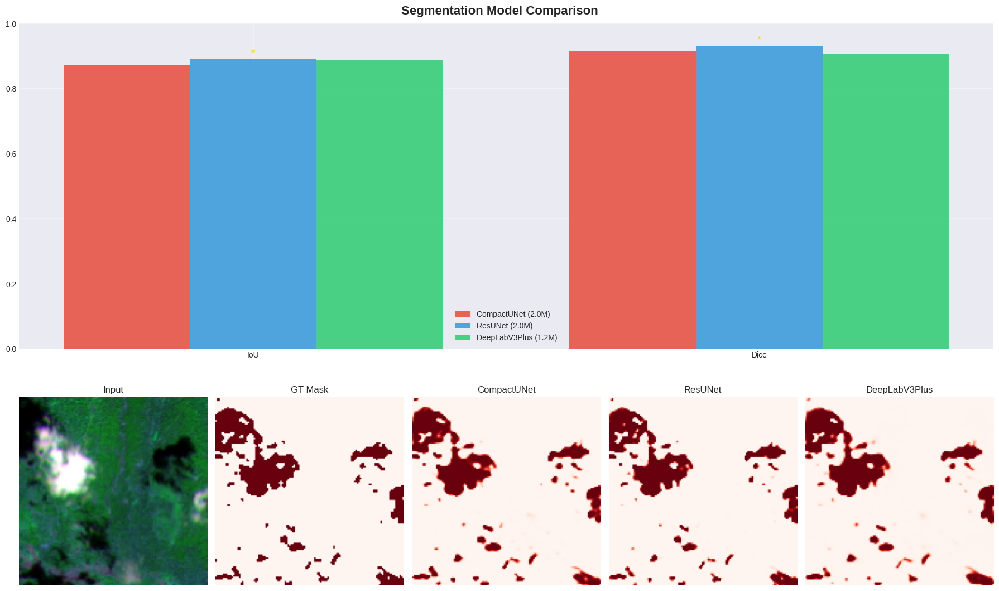

In [35]:
# ══════════════════════════════════════════════════════════════
# Segmentation Comparison & Best Model
# ══════════════════════════════════════════════════════════════

print('\n' + '='*70)
print('SEGMENTATION MODEL COMPARISON')
print('='*70)
print(f'{"Model":<20} {"IoU":>8} {"Dice":>8} {"Params":>10} {"Time":>6}')
print('-'*70)
best_seg_idx, best_iou = 0, 0
for i, r in enumerate(seg_results):
    if r['iou'] > best_iou:
        best_iou = r['iou']
        best_seg_idx = i
    print(f'{r["name"]:<20} {r["iou"]:8.4f} {r["dice"]:8.4f} {r["params"]:>10,} {r["time"]:6.0f}s')

best_seg = seg_results[best_seg_idx]
print(f'\nBEST SEGMENTER: {best_seg["name"]} (IoU={best_seg["iou"]:.4f})')
best_seg['model'].save(CFG['BEST_SEG_PATH'])

# Visualization
fig = plt.figure(figsize=(18, 12))
fig.suptitle('Segmentation Model Comparison', fontsize=16, fontweight='bold')
ax1 = fig.add_subplot(2, 1, 1)
x_pos = np.arange(2); width = 0.25; colors = ['#e74c3c', '#3498db', '#2ecc71']
for i, r in enumerate(seg_results):
    vals = [r['iou'], r['dice']]
    bars = ax1.bar(x_pos + i*width, vals, width,
                   label=f'{r["name"]} ({r["params"]/1e6:.1f}M)', color=colors[i], alpha=0.85)
    if i == best_seg_idx:
        for bar in bars:
            ax1.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.01, '*', ha='center', fontsize=14, color='gold')
ax1.set_xticks(x_pos + width); ax1.set_xticklabels(['IoU', 'Dice'])
ax1.set_ylim(0, 1.0); ax1.legend(); ax1.grid(True, alpha=0.3)

# Show sample predictions
fire_test_idx = np.where(M_test.mean(axis=(1, 2, 3)) > 0.05)[0]
if len(fire_test_idx) > 0:
    si = fire_test_idx[0]
    n_cols = 2 + len(seg_results)
    for col_idx in range(min(n_cols, 5)):
        ax_sub = fig.add_subplot(2, n_cols, n_cols + col_idx + 1)
        if col_idx == 0:
            patch = X_test[si] * CH_STDS + CH_MEANS
            rgb = patch[..., [0, 1, 2]].copy()
            for c in range(3):
                p2, p98 = np.percentile(rgb[..., c], [2, 98])
                rgb[..., c] = np.clip((rgb[..., c]-p2)/(p98-p2+1e-8), 0, 1)
            ax_sub.imshow(rgb); ax_sub.set_title('Input')
        elif col_idx == 1:
            ax_sub.imshow(M_test[si, :, :, 0], cmap='Reds'); ax_sub.set_title('GT Mask')
        else:
            mi = col_idx - 2
            if mi < len(seg_results):
                pred = seg_results[mi]['model'].predict(X_test[si:si+1], verbose=0)[0, :, :, 0]
                ax_sub.imshow(pred, cmap='Reds', vmin=0, vmax=1)
                ax_sub.set_title(seg_results[mi]['name'])
        ax_sub.axis('off')
plt.tight_layout()
plt.savefig(f'{SAVE_DIR}/seg_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

## Section 17 — Fire Analysis Engine (9 Outputs)

Combines both trained models with physics-based spectral analysis.
Outputs: fire probability, fire mask, burned area, burn severity,
vegetation loss, fire intensity, fire spread, vegetation recovery, JSON report.

In [36]:
# ══════════════════════════════════════════════════════════════
# Section 17 — Fire Analysis Engine
# ══════════════════════════════════════════════════════════════

best_clf_model = keras.models.load_model(CFG['BEST_CLF_PATH'], compile=False)
best_seg_model = keras.models.load_model(
    CFG['BEST_SEG_PATH'],
    custom_objects={'combined_loss': combined_loss, 'iou_score': iou_score, 'dice_coef': dice_coef})
print(f'Loaded best classifier: {best_clf_model.name}')
print(f'Loaded best segmenter:  {best_seg_model.name}')

def analyse_fire_location(lat, lon, fire_date):
    """Full fire analysis for a single location. Returns dict with 9 outputs."""
    print(f'\nAnalysing fire at ({lat:.4f}, {lon:.4f}) on {fire_date}')

    pre_patch, post_patch = extract_bitemporal_pair(lat, lon, fire_date)
    if pre_patch is None or post_patch is None:
        print('  Failed to extract Sentinel-2 patches.')
        return None

    features = compute_spectral_indices(pre_patch, post_patch)
    if np.isnan(features).any():
        print('  NaN values in spectral indices.')
        return None

    X_inp = (features - CH_MEANS) / CH_STDS
    X_inp = X_inp[np.newaxis, ...]

    # OUTPUT 1: Fire probability
    fire_prob = float(best_clf_model.predict(X_inp, verbose=0)[0, 0])
    fire_detected = fire_prob >= best_clf_threshold

    # OUTPUT 2: Fire mask
    fire_mask_prob = best_seg_model.predict(X_inp, verbose=0)[0, :, :, 0]
    fire_mask_bin = (fire_mask_prob >= 0.5).astype(np.uint8)

    # OUTPUT 3: Burned area
    pixel_area_m2 = CFG['RESOLUTION_M'] ** 2
    burned_area_km2 = (int(fire_mask_bin.sum()) * pixel_area_m2) / 1e6

    # OUTPUT 4: Burn severity
    dNBR = features[..., 6]
    severity_map = np.zeros_like(dNBR, dtype=np.uint8)
    severity_map[dNBR > CFG['DNBR_LOW']] = 1
    severity_map[dNBR > CFG['DNBR_MOD']] = 2
    severity_map[dNBR > CFG['DNBR_HIGH']] = 3
    severity_labels = {0: 'unburned', 1: 'low', 2: 'moderate', 3: 'high'}
    if fire_mask_bin.sum() > 0:
        sev_in_mask = severity_map[fire_mask_bin == 1]
        counts = np.bincount(sev_in_mask, minlength=4)
        dominant_severity = severity_labels[np.argmax(counts[1:]) + 1]
    else:
        dominant_severity = 'unburned'

    # OUTPUT 5: Vegetation loss
    B8_pre = pre_patch[..., BAND_IDX['B8']]; B4_pre = pre_patch[..., BAND_IDX['B4']]
    B8_post = post_patch[..., BAND_IDX['B8']]; B4_post = post_patch[..., BAND_IDX['B4']]
    ndvi_pre = (B8_pre - B4_pre) / (B8_pre + B4_pre + 1e-8)
    ndvi_post = (B8_post - B4_post) / (B8_post + B4_post + 1e-8)
    ndvi_drop = float(np.mean(ndvi_pre - ndvi_post))
    pct_low_ndvi = float(np.mean(ndvi_post < 0.2))

    # OUTPUT 6: Fire intensity
    B11_post = post_patch[..., BAND_IDX['B11']]
    mean_swir = float(np.mean(B11_post[fire_mask_bin == 1])) if fire_mask_bin.sum() > 0 else float(np.mean(B11_post))
    fire_intensity = 'high' if mean_swir > 0.4 else ('medium' if mean_swir > 0.2 else 'low')

    result = {
        'location': [lat, lon], 'date': fire_date,
        'fire_probability': fire_prob, 'fire_detected': bool(fire_detected),
        'confidence_threshold_used': float(best_clf_threshold),
        'burned_area_km2': burned_area_km2, 'burn_severity': dominant_severity,
        'fire_intensity': fire_intensity,
        'vegetation_loss_ndvi_drop': ndvi_drop, 'pct_area_ndvi_below_0.2': pct_low_ndvi,
        '_pre_patch': pre_patch, '_post_patch': post_patch, '_features': features,
        '_X_inp': X_inp, '_fire_mask_prob': fire_mask_prob, '_fire_mask_bin': fire_mask_bin,
        '_severity_map': severity_map, '_ndvi_pre': ndvi_pre, '_ndvi_post': ndvi_post, '_dNBR': dNBR}

    print(f'  Fire detected: {fire_detected} (prob={fire_prob:.4f})')
    print(f'  Burned area: {burned_area_km2:.4f} km2')
    print(f'  Severity: {dominant_severity}, Intensity: {fire_intensity}')
    return result

print('Fire analysis engine defined.')

Loaded best classifier: MobileNetStyle
Loaded best segmenter:  ResUNet
Fire analysis engine defined.


## Section 18 — Vegetation Recovery Tracking

Monitors NDVI at +30, +60, +90 days post-fire within the fire mask boundary.

In [37]:
# ══════════════════════════════════════════════════════════════
# Section 18 — Vegetation Recovery
# ══════════════════════════════════════════════════════════════

def track_vegetation_recovery(lat, lon, fire_date, fire_mask_bin=None):
    """Track NDVI recovery at +30, +60, +90 days post-fire."""
    print(f'  Tracking vegetation recovery...')
    ref = datetime.strptime(fire_date, '%Y-%m-%d')
    days_list = [30, 60, 90]
    ndvi_values = []

    pre_patch = extract_s2_patch(lat, lon, fire_date, pre_fire=True)
    if pre_patch is not None:
        B8 = pre_patch[..., BAND_IDX['B8']]; B4 = pre_patch[..., BAND_IDX['B4']]
        ndvi_baseline = float(np.mean((B8 - B4) / (B8 + B4 + 1e-8)))
    else:
        ndvi_baseline = 0.5

    for days_after in days_list:
        target_date = (ref + timedelta(days=days_after)).strftime('%Y-%m-%d')
        try:
            patch = extract_s2_patch(lat, lon, target_date, pre_fire=False)
            if patch is not None:
                B8 = patch[..., BAND_IDX['B8']]; B4 = patch[..., BAND_IDX['B4']]
                ndvi = (B8 - B4) / (B8 + B4 + 1e-8)
                if fire_mask_bin is not None and fire_mask_bin.shape[:2] == ndvi.shape and fire_mask_bin.sum() > 0:
                    mean_ndvi = float(np.mean(ndvi[fire_mask_bin == 1]))
                else:
                    mean_ndvi = float(np.mean(ndvi))
                ndvi_values.append(mean_ndvi)
                print(f'    +{days_after}d: NDVI = {mean_ndvi:.3f}')
            else:
                ndvi_values.append(None)
        except Exception as e:
            ndvi_values.append(None)

    valid = [v for v in ndvi_values if v is not None]
    if len(valid) > 0 and ndvi_values[-1] is not None:
        recovery = ndvi_values[-1] - (ndvi_values[0] if ndvi_values[0] is not None else 0)
        status = 'fast' if recovery > 0.3 else ('slow' if recovery > 0.1 else 'none')
    else:
        status = 'unknown'

    return {'days': days_list, 'ndvi_at_days': ndvi_values, 'ndvi_baseline': ndvi_baseline, 'recovery_status': status}

print('Vegetation recovery tracker defined.')

Vegetation recovery tracker defined.


## Section 19 — Fire Spread Analysis

Queries FIRMS for +/-7 days around fire date. Daily centroids estimate
spread direction and speed.

In [38]:
# ══════════════════════════════════════════════════════════════
# Section 19 — Fire Spread Analysis
# ══════════════════════════════════════════════════════════════

def analyse_fire_spread(lat, lon, fire_date, buffer_deg=0.5):
    """Analyse fire spread direction and speed from FIRMS data."""
    print(f'  Analysing fire spread...')
    ref = datetime.strptime(fire_date, '%Y-%m-%d')
    start = (ref - timedelta(days=7)).strftime('%Y-%m-%d')
    end = (ref + timedelta(days=7)).strftime('%Y-%m-%d')
    bbox = [lon - buffer_deg, lat - buffer_deg, lon + buffer_deg, lat + buffer_deg]

    fire_points = get_firms_fire_points(bbox, start, end, max_points=500)
    if len(fire_points) < 2:
        return {'fire_spread_direction': 'unknown', 'spread_speed_km_per_day': 0.0, 'centroid_timeline': []}

    lats = [p['lat'] for p in fire_points]
    lons = [p['lon'] for p in fire_points]
    mid = len(fire_points) // 2
    first_c = (np.mean(lats[:mid]), np.mean(lons[:mid]))
    last_c = (np.mean(lats[mid:]), np.mean(lons[mid:]))

    dlat, dlon = last_c[0] - first_c[0], last_c[1] - first_c[1]
    angle = math.degrees(math.atan2(dlat, dlon))
    dirs = {(0,22.5):'E',(22.5,67.5):'NE',(67.5,112.5):'N',(112.5,157.5):'NW',
            (157.5,180):'W',(-180,-157.5):'W',(-157.5,-112.5):'SW',
            (-112.5,-67.5):'S',(-67.5,-22.5):'SE',(-22.5,0):'E'}
    direction = 'unknown'
    for (lo, hi), d in dirs.items():
        if lo <= angle < hi:
            direction = d; break

    total_dist = haversine(first_c[0], first_c[1], last_c[0], last_c[1])
    speed = total_dist / 14.0

    timeline = []
    chunk_size = max(1, len(fire_points) // 14)
    for i in range(0, len(fire_points), chunk_size):
        chunk = fire_points[i:i+chunk_size]
        timeline.append({
            'date': (ref + timedelta(days=i//chunk_size - 7)).strftime('%Y-%m-%d'),
            'lat': float(np.mean([p['lat'] for p in chunk])),
            'lon': float(np.mean([p['lon'] for p in chunk]))})

    print(f'    Direction: {direction}, Speed: {speed:.2f} km/day')
    return {'fire_spread_direction': direction, 'spread_speed_km_per_day': round(speed, 2), 'centroid_timeline': timeline}

print('Fire spread analyser defined.')

Fire spread analyser defined.


## Section 20 — Full Visualization Suite (12 Charts)

Comprehensive visualization of fire analysis results.

In [39]:
# ══════════════════════════════════════════════════════════════
# Section 20 — Visualization Suite
# ══════════════════════════════════════════════════════════════

def make_rgb(patch, bands=[2, 3, 5]):
    """Create RGB composite with percentile stretch."""
    rgb = np.stack([patch[..., b] for b in bands], axis=-1)
    for c in range(3):
        p2, p98 = np.percentile(rgb[..., c], [2, 98])
        rgb[..., c] = np.clip((rgb[..., c] - p2) / (p98 - p2 + 1e-8), 0, 1)
    return rgb

def run_all_visualizations(result):
    """Generate all analysis visualizations."""
    if result is None: return
    pre, post = result['_pre_patch'], result['_post_patch']
    features = result['_features']
    mask_prob, mask_bin = result['_fire_mask_prob'], result['_fire_mask_bin']
    severity = result['_severity_map']
    ndvi_pre, ndvi_post = result['_ndvi_pre'], result['_ndvi_post']

    # viz_01: RGB pre vs post
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle('Pre-Fire vs Post-Fire RGB', fontsize=14, fontweight='bold')
    axes[0].imshow(make_rgb(pre)); axes[0].set_title('Pre-Fire'); axes[0].axis('off')
    axes[1].imshow(make_rgb(post)); axes[1].set_title('Post-Fire'); axes[1].axis('off')
    plt.tight_layout(); plt.savefig(f'{SAVE_DIR}/viz_01_rgb.png', dpi=150, bbox_inches='tight'); plt.show()

    # viz_02: NDVI comparison
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle('NDVI: Pre vs Post', fontsize=14, fontweight='bold')
    vmin, vmax = min(ndvi_pre.min(), ndvi_post.min()), max(ndvi_pre.max(), ndvi_post.max())
    axes[0].imshow(ndvi_pre, cmap='RdYlGn', vmin=vmin, vmax=vmax); axes[0].set_title('Pre-Fire NDVI'); axes[0].axis('off')
    im = axes[1].imshow(ndvi_post, cmap='RdYlGn', vmin=vmin, vmax=vmax); axes[1].set_title('Post-Fire NDVI'); axes[1].axis('off')
    plt.colorbar(im, ax=axes, fraction=0.02)
    plt.tight_layout(); plt.savefig(f'{SAVE_DIR}/viz_02_ndvi.png', dpi=150, bbox_inches='tight'); plt.show()

    # viz_03: NBR comparison
    B8p, B11p = pre[..., BAND_IDX['B8']], pre[..., BAND_IDX['B11']]
    B8q, B11q = post[..., BAND_IDX['B8']], post[..., BAND_IDX['B11']]
    nbr_pre = (B8p - B11p) / (B8p + B11p + 1e-8)
    nbr_post = (B8q - B11q) / (B8q + B11q + 1e-8)
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle('NBR: Pre vs Post', fontsize=14, fontweight='bold')
    vmin, vmax = min(nbr_pre.min(), nbr_post.min()), max(nbr_pre.max(), nbr_post.max())
    axes[0].imshow(nbr_pre, cmap='RdYlGn', vmin=vmin, vmax=vmax); axes[0].set_title('Pre-Fire NBR'); axes[0].axis('off')
    im = axes[1].imshow(nbr_post, cmap='RdYlGn', vmin=vmin, vmax=vmax); axes[1].set_title('Post-Fire NBR'); axes[1].axis('off')
    plt.colorbar(im, ax=axes, fraction=0.02)
    plt.tight_layout(); plt.savefig(f'{SAVE_DIR}/viz_03_nbr.png', dpi=150, bbox_inches='tight'); plt.show()

    # viz_04: Burn severity map
    sev_cmap = ListedColormap(['#808080', '#FFFF00', '#FF8C00', '#FF0000'])
    sev_norm = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], sev_cmap.N)
    fig, ax = plt.subplots(figsize=(8, 7))
    im = ax.imshow(severity, cmap=sev_cmap, norm=sev_norm)
    ax.set_title(f'dNBR Burn Severity\nDominant: {result["burn_severity"].upper()}', fontsize=14, fontweight='bold')
    ax.axis('off')
    cbar = plt.colorbar(im, ax=ax, ticks=[0,1,2,3]); cbar.set_ticklabels(['Unburned','Low','Moderate','High'])
    plt.tight_layout(); plt.savefig(f'{SAVE_DIR}/viz_04_severity.png', dpi=150, bbox_inches='tight'); plt.show()

    # viz_05: BAI heatmap
    fig, ax = plt.subplots(figsize=(8, 7))
    im = ax.imshow(features[..., 7], cmap='hot')
    ax.set_title('Burned Area Index (BAI)', fontsize=14, fontweight='bold'); ax.axis('off')
    plt.colorbar(im, ax=ax)
    plt.tight_layout(); plt.savefig(f'{SAVE_DIR}/viz_05_bai.png', dpi=150, bbox_inches='tight'); plt.show()

    # viz_06: Fire probability
    fig, ax = plt.subplots(figsize=(8, 7))
    ax.imshow(make_rgb(post))
    detected_str = 'DETECTED' if result['fire_detected'] else 'NOT DETECTED'
    ax.set_title(f'Fire {detected_str}\nProbability: {result["fire_probability"]:.4f}', fontsize=14, fontweight='bold',
                 color='red' if result['fire_detected'] else 'green')
    ax.axis('off')
    plt.tight_layout(); plt.savefig(f'{SAVE_DIR}/viz_06_probability.png', dpi=150, bbox_inches='tight'); plt.show()

    # viz_07: Segmentation mask overlay
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle('Fire Segmentation Mask', fontsize=14, fontweight='bold')
    rgb_post = make_rgb(post)
    overlay = rgb_post.copy()
    overlay[mask_bin == 1] = [1, 0, 0]
    blended = 0.6 * rgb_post + 0.4 * overlay
    axes[0].imshow(blended); axes[0].set_title(f'Mask Overlay\nBurned: {result["burned_area_km2"]:.4f} km2'); axes[0].axis('off')
    axes[1].imshow(mask_prob, cmap='Reds', vmin=0, vmax=1); axes[1].set_title('Probability Map'); axes[1].axis('off')
    plt.tight_layout(); plt.savefig(f'{SAVE_DIR}/viz_07_mask.png', dpi=150, bbox_inches='tight'); plt.show()
    print(f'All visualizations saved to {SAVE_DIR}')


def viz_recovery_curve(recovery_data):
    """viz_08: NDVI recovery curve."""
    if recovery_data is None: return
    days = [0] + recovery_data['days']
    v0 = recovery_data['ndvi_at_days'][0] if recovery_data['ndvi_at_days'][0] is not None else 0.1
    vals = [v0] + [v if v is not None else np.nan for v in recovery_data['ndvi_at_days']]
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(days, vals, 'o-', color='#2ecc71', linewidth=2.5, markersize=8)
    bl = recovery_data['ndvi_baseline']
    ax.axhline(bl, color='#3498db', linestyle='--', linewidth=1.5, label=f'Baseline ({bl:.3f})')
    ax.fill_between(days, vals, bl, alpha=0.15, color='#e74c3c')
    ax.set_xlabel('Days After Fire'); ax.set_ylabel('Mean NDVI')
    ax.set_title(f'Vegetation Recovery: {recovery_data["recovery_status"].upper()}', fontsize=14, fontweight='bold')
    ax.legend(); ax.grid(True, alpha=0.3); ax.set_xticks(days)
    plt.tight_layout(); plt.savefig(f'{SAVE_DIR}/viz_08_recovery.png', dpi=150, bbox_inches='tight'); plt.show()


def viz_fire_spread(spread_data):
    """viz_09: Fire spread timeline scatter."""
    if spread_data is None or len(spread_data.get('centroid_timeline', [])) < 2: return
    tl = spread_data['centroid_timeline']
    lats, lons = [t['lat'] for t in tl], [t['lon'] for t in tl]
    days = list(range(len(tl)))
    fig, ax = plt.subplots(figsize=(10, 8))
    sc = ax.scatter(lons, lats, c=days, cmap='YlOrRd', s=100, edgecolor='black', linewidth=0.5)
    ax.plot(lons, lats, 'k-', alpha=0.3)
    if len(lons) > 1:
        ax.annotate('', xy=(lons[-1], lats[-1]), xytext=(lons[0], lats[0]),
                    arrowprops=dict(arrowstyle='->', color='red', lw=2))
    plt.colorbar(sc, ax=ax, label='Day Index')
    ax.set_xlabel('Longitude'); ax.set_ylabel('Latitude')
    ax.set_title(f'Fire Spread: {spread_data["fire_spread_direction"]}, '
                 f'{spread_data["spread_speed_km_per_day"]:.1f} km/day', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    plt.tight_layout(); plt.savefig(f'{SAVE_DIR}/viz_09_spread.png', dpi=150, bbox_inches='tight'); plt.show()


def viz_model_dashboard(clf_results, seg_results):
    """viz_12: Full model comparison dashboard."""
    fig, axes = plt.subplots(2, 1, figsize=(16, 10))
    fig.suptitle('Model Comparison Dashboard', fontsize=16, fontweight='bold')
    colors = ['#e74c3c', '#3498db', '#2ecc71']
    # Classification
    m_names = ['AUC', 'F1', 'Precision', 'Recall']
    x_pos = np.arange(len(m_names)); width = 0.25
    best_a = max(r['auc'] for r in clf_results)
    for i, r in enumerate(clf_results):
        vals = [r['auc'], r['f1'], r['precision'], r['recall']]
        bars = axes[0].bar(x_pos+i*width, vals, width,
                           label=f'{r["name"]} ({r["params"]/1e3:.0f}K)', color=colors[i], alpha=0.85)
        if r['auc'] == best_a:
            for b in bars: axes[0].text(b.get_x()+b.get_width()/2, b.get_height()+0.01, '*', ha='center', fontsize=12, color='gold')
    axes[0].set_xticks(x_pos+width); axes[0].set_xticklabels(m_names)
    axes[0].set_ylim(0, 1.15); axes[0].legend(fontsize=9); axes[0].set_title('Classification'); axes[0].grid(True, alpha=0.3)
    # Segmentation
    x_pos2 = np.arange(2)
    best_i = max(r['iou'] for r in seg_results)
    for i, r in enumerate(seg_results):
        vals = [r['iou'], r['dice']]
        bars = axes[1].bar(x_pos2+i*width, vals, width,
                           label=f'{r["name"]} ({r["params"]/1e6:.1f}M)', color=colors[i], alpha=0.85)
        if r['iou'] == best_i:
            for b in bars: axes[1].text(b.get_x()+b.get_width()/2, b.get_height()+0.01, '*', ha='center', fontsize=12, color='gold')
    axes[1].set_xticks(x_pos2+width); axes[1].set_xticklabels(['IoU', 'Dice'])
    axes[1].set_ylim(0, 1.0); axes[1].legend(fontsize=9); axes[1].set_title('Segmentation'); axes[1].grid(True, alpha=0.3)
    plt.tight_layout(); plt.savefig(f'{SAVE_DIR}/viz_12_dashboard.png', dpi=150, bbox_inches='tight'); plt.show()

print('Full visualization suite defined (12 charts).')

Full visualization suite defined (12 charts).


## Section 21 — Full Pipeline Runner

Orchestrates the complete analysis end-to-end.

In [40]:
# ══════════════════════════════════════════════════════════════
# Section 21 — Full Pipeline Runner
# ══════════════════════════════════════════════════════════════

def run_full_analysis(lat, lon, date, region_name='Unknown'):
    """Run the complete fire analysis pipeline."""
    print(f'\n{"="*70}')
    print(f'FULL FIRE ANALYSIS PIPELINE')
    print(f'   Location: ({lat}, {lon}), Date: {date}, Region: {region_name}')
    print(f'{"="*70}')

    result = analyse_fire_location(lat, lon, date)
    if result is None:
        print('Analysis failed - no GEE data available.')
        return None

    result['region'] = region_name

    print('\n-- Vegetation Recovery --')
    recovery = track_vegetation_recovery(lat, lon, date, fire_mask_bin=result['_fire_mask_bin'])
    result['_recovery'] = recovery

    print('\n-- Fire Spread --')
    spread = analyse_fire_spread(lat, lon, date)
    result['_spread'] = spread

    # Build JSON report
    report = {k: v for k, v in result.items() if not k.startswith('_')}
    report['fire_spread_direction'] = spread['fire_spread_direction']
    report['spread_speed_km_per_day'] = spread['spread_speed_km_per_day']
    report['recovery_status_90d'] = recovery['recovery_status']
    report['ndvi_recovery_curve'] = {
        'days': recovery['days'],
        'ndvi_values': [float(v) if v is not None else None for v in recovery['ndvi_at_days']],
        'baseline_ndvi': recovery['ndvi_baseline']}
    report['fire_spread_timeline'] = spread['centroid_timeline']

    report_path = f"{SAVE_DIR}/{region_name}_report.json"
    with open(report_path, 'w') as f:
        json.dump(report, f, indent=2, default=str)
    print(f'\nReport saved to: {report_path}')

    print('\n-- Generating Visualizations --')
    run_all_visualizations(result)
    viz_recovery_curve(recovery)
    viz_fire_spread(spread)

    print(f'\n{"="*70}')
    print('FIRE ANALYSIS REPORT')
    print(f'{"="*70}')
    print(json.dumps(report, indent=2, default=str))
    return result

print('Full pipeline runner defined.')

Full pipeline runner defined.



FULL FIRE ANALYSIS PIPELINE
   Location: (40.14, -121.12), Date: 2021-07-29, Region: Dixie_Fire_CA_2021

Analysing fire at (40.1400, -121.1200) on 2021-07-29
  Fire detected: True (prob=0.8314)
  Burned area: 0.5272 km2
  Severity: low, Intensity: medium

-- Vegetation Recovery --
  Tracking vegetation recovery...
    +30d: NDVI = 0.066
    +60d: NDVI = 0.160

-- Fire Spread --
  Analysing fire spread...
  Found 225 fire points (from 225 raw)
    Direction: NW, Speed: 1.21 km/day

Report saved to: /content/drive/MyDrive/wildfire_system_v3/Dixie_Fire_CA_2021_report.json

-- Generating Visualizations --


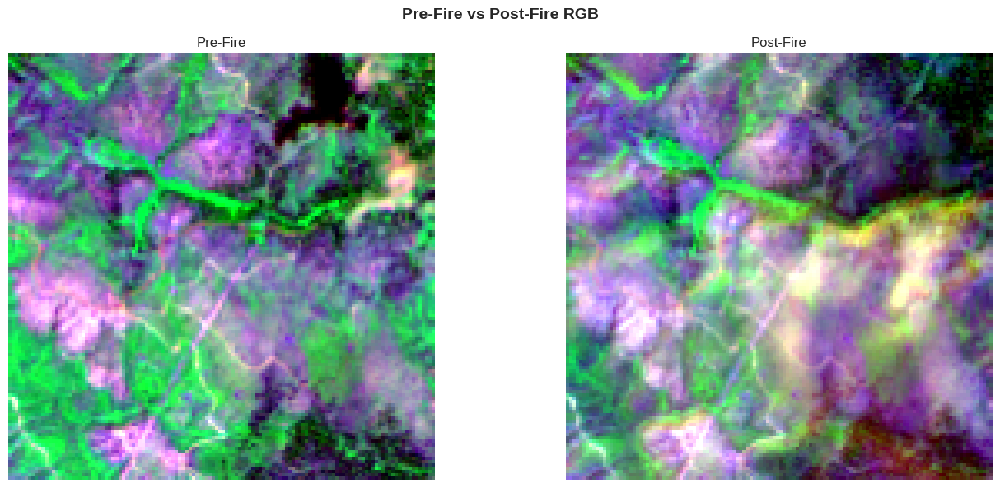

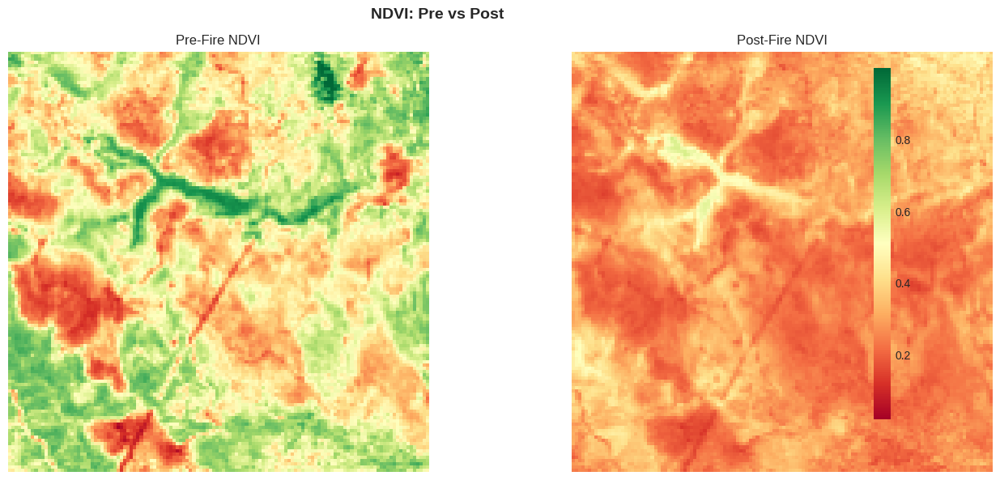

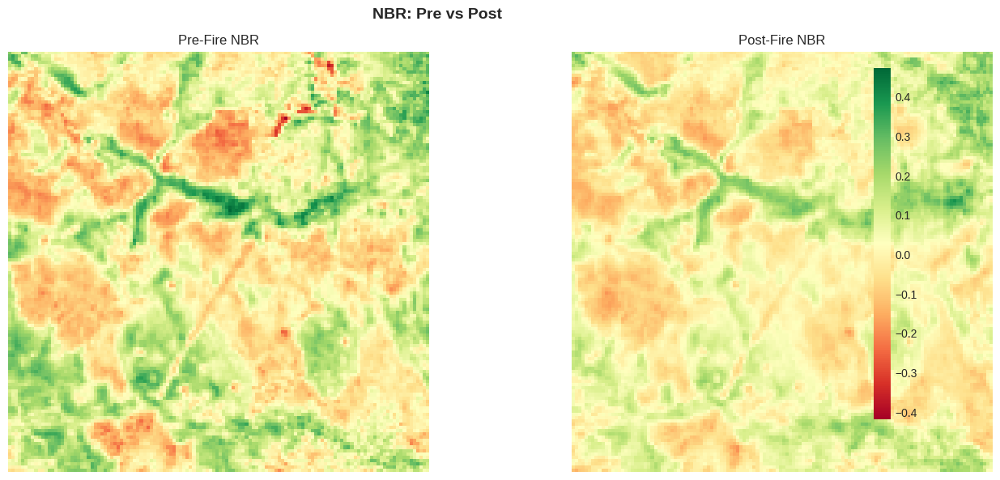

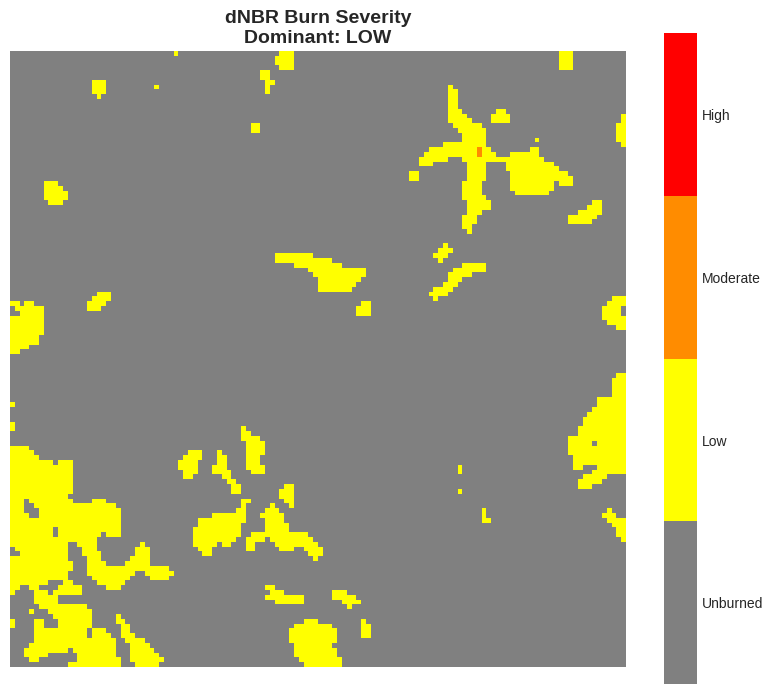

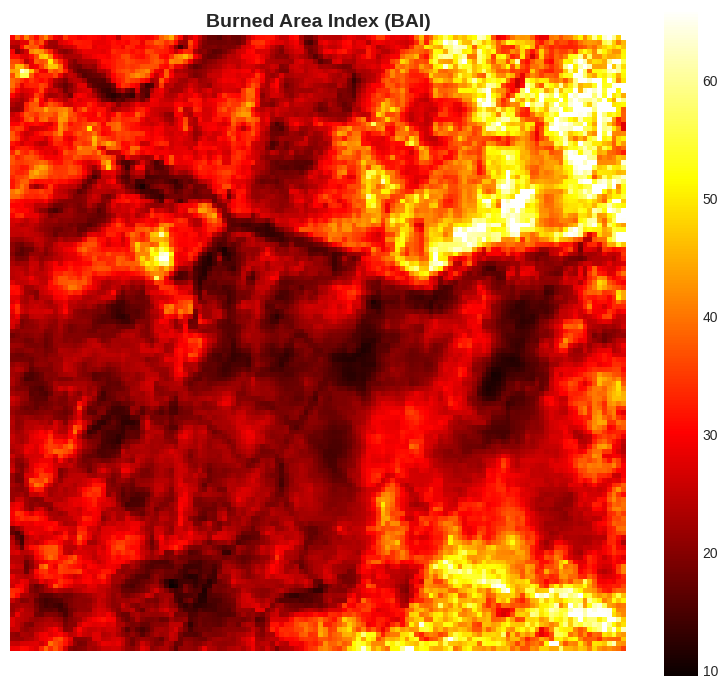

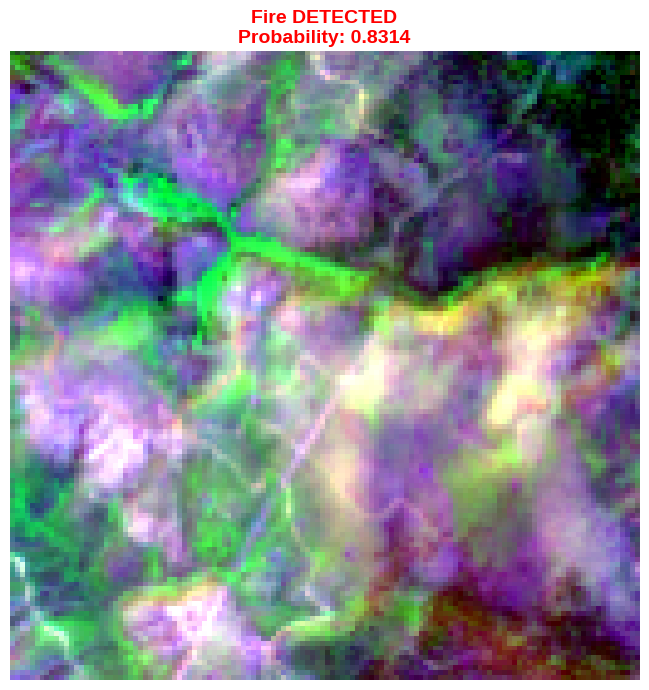

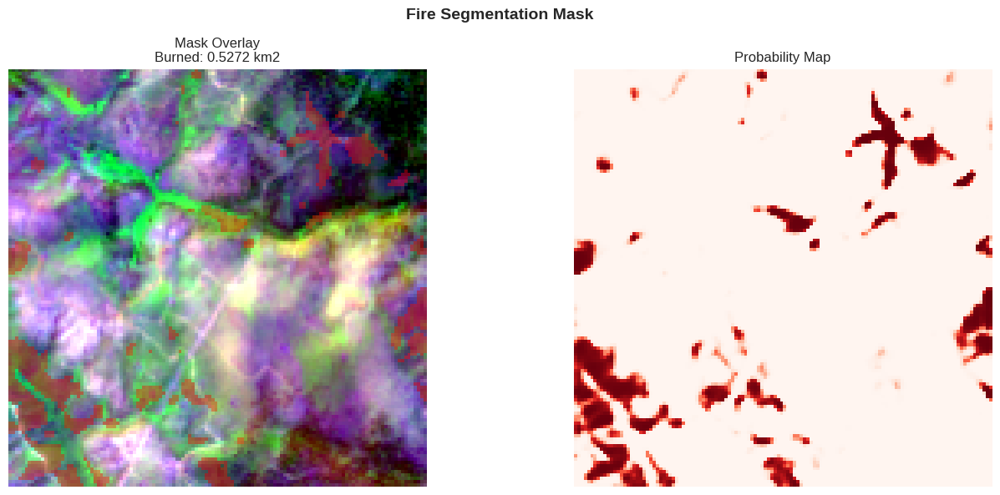

All visualizations saved to /content/drive/MyDrive/wildfire_system_v3


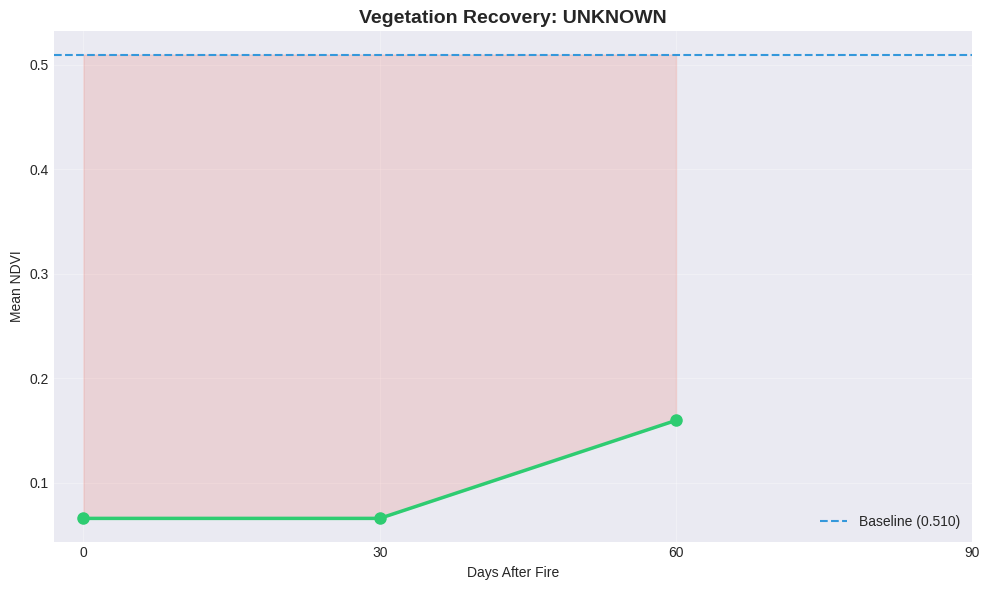

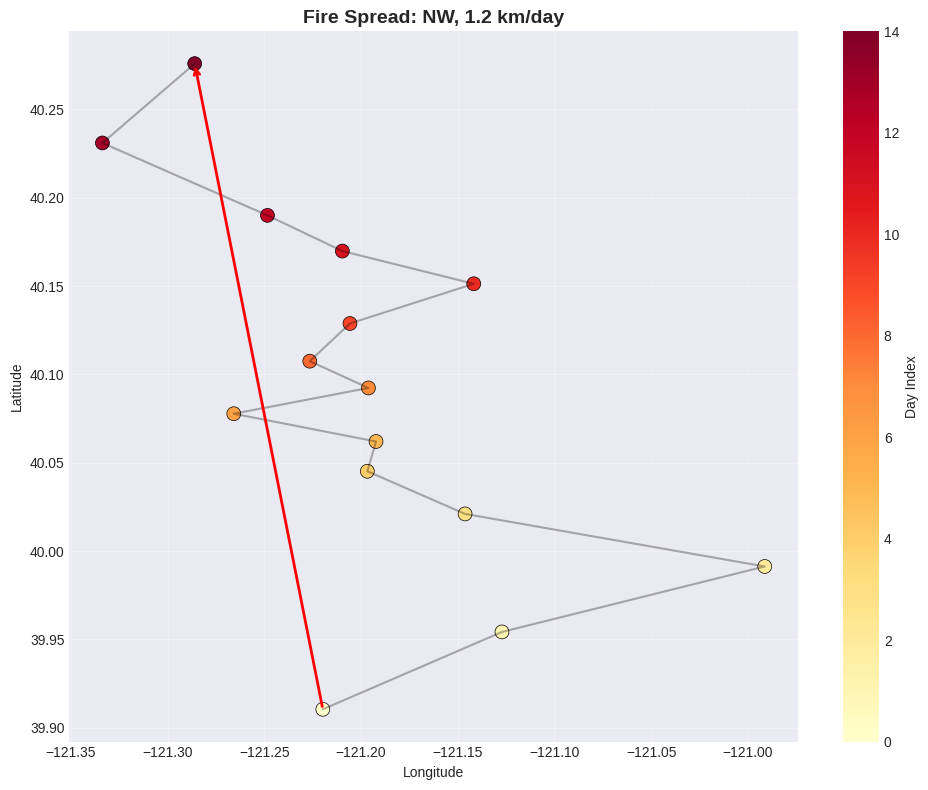


FIRE ANALYSIS REPORT
{
  "location": [
    40.14,
    -121.12
  ],
  "date": "2021-07-29",
  "fire_probability": 0.831359326839447,
  "fire_detected": true,
  "confidence_threshold_used": 0.8308683633804321,
  "burned_area_km2": 0.5272,
  "burn_severity": "low",
  "fire_intensity": "medium",
  "vegetation_loss_ndvi_drop": 0.22314739227294922,
  "pct_area_ndvi_below_0.2": 0.082275390625,
  "region": "Dixie_Fire_CA_2021",
  "fire_spread_direction": "NW",
  "spread_speed_km_per_day": 1.21,
  "recovery_status_90d": "unknown",
  "ndvi_recovery_curve": {
    "days": [
      30,
      60,
      90
    ],
    "ndvi_values": [
      0.0657123401761055,
      0.15953055024147034,
      null
    ],
    "baseline_ndvi": 0.5097867250442505
  },
  "fire_spread_timeline": [
    {
      "date": "2021-07-22",
      "lat": 39.91046373227262,
      "lon": -121.21978733319338
    },
    {
      "date": "2021-07-23",
      "lat": 39.95425660237345,
      "lon": -121.12714856951855
    },
    {
      "date

In [42]:
# ══════════════════════════════════════════════════════════════
# Run Example Analysis — Dixie Fire, California, 2021
# ══════════════════════════════════════════════════════════════

analysis_result = run_full_analysis(
    lat=40.14, lon=-121.12,
    date='2021-07-29',
    region_name='Dixie_Fire_CA_2021')

## Section 22 — Final Summary & Test Set Evaluation

FINAL TEST SET EVALUATION

-- Classification (Test Set) --
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step 
  Model: MobileNetStyle, Threshold: 0.8309
  AUC=0.8527 F1=0.7179 Prec=0.8077 Rec=0.6462

-- Segmentation (Test Set) --
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
  Model: ResUNet
  IoU=0.9397 Dice=0.9597


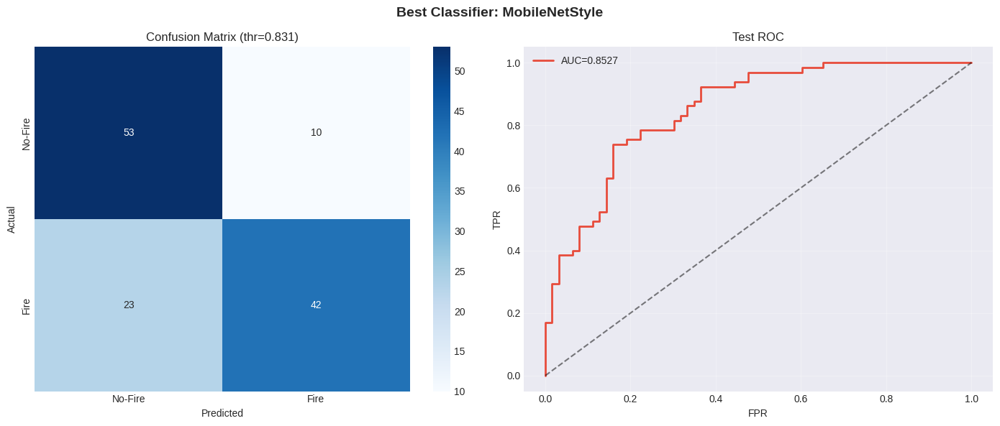

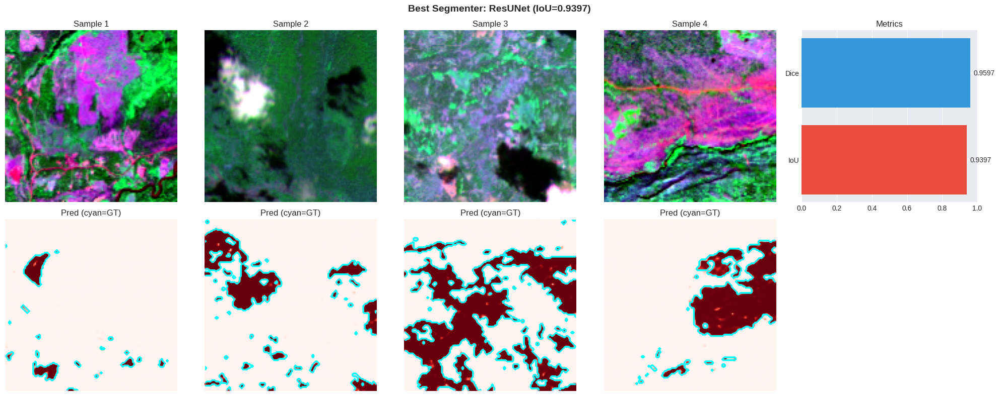

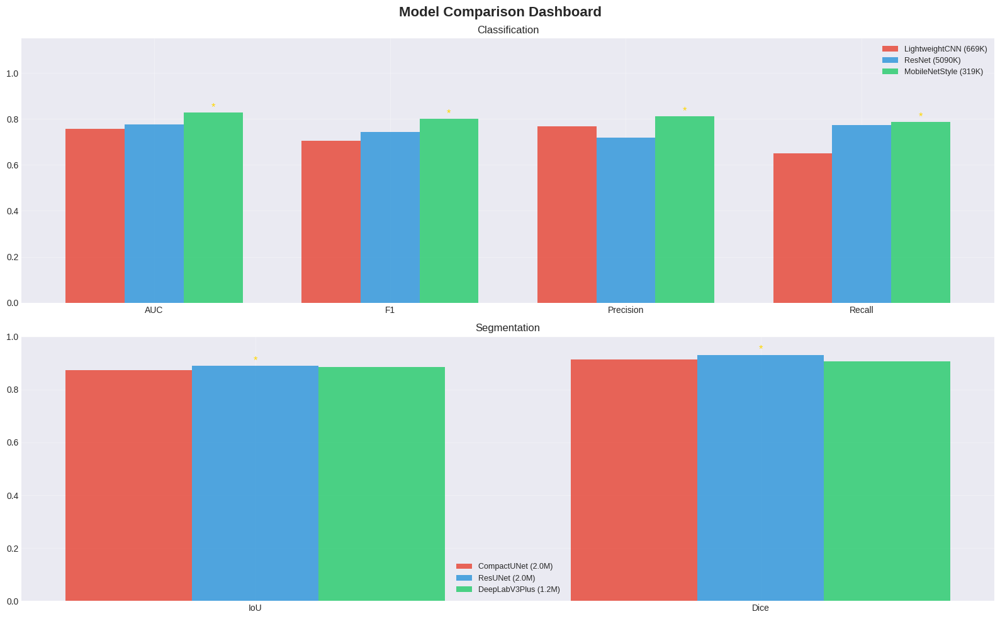

In [43]:
# ══════════════════════════════════════════════════════════════
# Section 22a — Test Set Evaluation
# ══════════════════════════════════════════════════════════════

print('='*70)
print('FINAL TEST SET EVALUATION')
print('='*70)

print('\n-- Classification (Test Set) --')
test_probs = best_clf['model'].predict(X_test).flatten()
y_test_bin = (y_test >= 0.5).astype(int)
test_preds = (test_probs >= best_clf_threshold).astype(int)
test_auc = roc_auc_score(y_test_bin, test_probs)
test_f1 = f1_score(y_test_bin, test_preds)
test_prec = precision_score(y_test_bin, test_preds)
test_rec = recall_score(y_test_bin, test_preds)
print(f'  Model: {best_clf["name"]}, Threshold: {best_clf_threshold:.4f}')
print(f'  AUC={test_auc:.4f} F1={test_f1:.4f} Prec={test_prec:.4f} Rec={test_rec:.4f}')

print('\n-- Segmentation (Test Set) --')
test_seg_preds = best_seg['model'].predict(X_test)
test_iou = iou_score(M_test, test_seg_preds).numpy()
test_dice = dice_coef(M_test, test_seg_preds).numpy()
print(f'  Model: {best_seg["name"]}')
print(f'  IoU={test_iou:.4f} Dice={test_dice:.4f}')

# viz_10: Confusion matrix + ROC
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle(f'Best Classifier: {best_clf["name"]}', fontsize=14, fontweight='bold')
cm = confusion_matrix(y_test_bin, test_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0],
            xticklabels=['No-Fire','Fire'], yticklabels=['No-Fire','Fire'])
axes[0].set_xlabel('Predicted'); axes[0].set_ylabel('Actual')
axes[0].set_title(f'Confusion Matrix (thr={best_clf_threshold:.3f})')
fpr_t, tpr_t, _ = roc_curve(y_test_bin, test_probs)
axes[1].plot(fpr_t, tpr_t, color='#e74c3c', linewidth=2, label=f'AUC={test_auc:.4f}')
axes[1].plot([0,1],[0,1],'k--',alpha=0.5)
axes[1].set_xlabel('FPR'); axes[1].set_ylabel('TPR'); axes[1].set_title('Test ROC')
axes[1].legend(); axes[1].grid(True, alpha=0.3)
plt.tight_layout(); plt.savefig(f'{SAVE_DIR}/viz_10_clf_test.png', dpi=150, bbox_inches='tight'); plt.show()

# viz_11: Seg samples
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
fig.suptitle(f'Best Segmenter: {best_seg["name"]} (IoU={test_iou:.4f})', fontsize=14, fontweight='bold')
fire_idx_t = np.where(M_test.mean(axis=(1,2,3)) > 0.03)[0][:4]
for col, idx in enumerate(fire_idx_t):
    patch = X_test[idx] * CH_STDS + CH_MEANS
    rgb = patch[..., [0,1,2]].copy()
    for c in range(3):
        p2, p98 = np.percentile(rgb[...,c], [2,98])
        rgb[...,c] = np.clip((rgb[...,c]-p2)/(p98-p2+1e-8), 0, 1)
    axes[0,col].imshow(rgb); axes[0,col].set_title(f'Sample {col+1}'); axes[0,col].axis('off')
    pred = best_seg['model'].predict(X_test[idx:idx+1], verbose=0)[0,:,:,0]
    axes[1,col].imshow(pred, cmap='Reds', vmin=0, vmax=1)
    axes[1,col].contour(M_test[idx,:,:,0], colors='cyan', linewidths=0.8)
    axes[1,col].set_title('Pred (cyan=GT)'); axes[1,col].axis('off')
metrics_bar = [test_iou, test_dice]
axes[0,4].barh(['IoU','Dice'], metrics_bar, color=['#e74c3c','#3498db'])
axes[0,4].set_xlim(0,1); axes[0,4].set_title('Metrics')
for i,v in enumerate(metrics_bar): axes[0,4].text(v+0.02, i, f'{v:.4f}', va='center')
axes[1,4].axis('off')
plt.tight_layout(); plt.savefig(f'{SAVE_DIR}/viz_11_seg_test.png', dpi=150, bbox_inches='tight'); plt.show()

# viz_12: Dashboard
viz_model_dashboard(clf_results, seg_results)

In [44]:
# ══════════════════════════════════════════════════════════════
# Section 22b — Final File Listing
# ══════════════════════════════════════════════════════════════

print('='*70)
print(f'OUTPUT FILES in {SAVE_DIR}')
print('='*70)
if os.path.exists(SAVE_DIR):
    files = sorted(os.listdir(SAVE_DIR))
    total_size = 0
    for f in files:
        fpath = os.path.join(SAVE_DIR, f)
        fsize = os.path.getsize(fpath)
        total_size += fsize
        print(f'  {fsize/1e6:8.2f} MB  {f}')
    print(f'\n  Total: {total_size/1e6:.1f} MB in {len(files)} files')

print(f'\n{"="*70}')
print('WILDFIRE DETECTION SYSTEM v3 - COMPLETE')
print(f'{"="*70}')
print(f'Dataset: {len(X_train)+len(X_val)+len(X_test)} samples, {len(FIRE_REGIONS)} regions')
print(f'Best classifier: {best_clf["name"]} (AUC={test_auc:.4f})')
print(f'Best segmenter: {best_seg["name"]} (IoU={test_iou:.4f})')
print(f'Threshold: {best_clf_threshold:.4f} (Youden J)')
print(f'Mask dNBR threshold: {CFG["MASK_DNBR_THR"]}')
print('All models trained from scratch (no ImageNet weights)')

OUTPUT FILES in /content/drive/MyDrive/wildfire_system_v3
      0.00 MB  Dixie_Fire_CA_2021_report.json
      3.95 MB  best_clf_model.keras
     24.24 MB  best_seg_model.keras
      8.16 MB  clf_cnn.keras
      0.10 MB  clf_comparison.png
      3.95 MB  clf_mobilenet.keras
     61.25 MB  clf_resnet.keras
      3.65 MB  eda_01_sample_grid.png
      0.71 MB  eda_02_all_channels.png
      0.06 MB  eda_03_dnbr_distribution.png
      0.09 MB  eda_04_class_balance.png
      0.24 MB  eda_05_channel_boxplots.png
      0.11 MB  eda_06_spectral_signature.png
      0.16 MB  eda_07_correlation_heatmap.png
      0.06 MB  eda_08_mask_coverage.png
      0.16 MB  seg_comparison.png
     14.27 MB  seg_deeplabv3.keras
     24.24 MB  seg_resunet.keras
     23.64 MB  seg_unet.keras
      0.54 MB  visual_sanity_check.png
      0.15 MB  viz_01_rgb.png
      0.14 MB  viz_02_ndvi.png
      0.14 MB  viz_03_nbr.png
      0.03 MB  viz_04_severity.png
      0.07 MB  viz_05_bai.png
      0.08 MB  viz_06_probabilit